# Clustering Features

We attempt to cluster features together both in the normal hidden activation space and in our sparse activation space to see if we can distinguish certain features that characterize specific digits.

In [1]:
import time

EXPERIMENT_TYPE = "SAE"
RUN_ID = time.time()

## SAE Params

In [2]:
HIDDEN_SIZE = 256
L1_PENALTY = 0.1

## Imports

In [3]:
import random
import copy

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE

import torch
from torch import nn
from torch.utils.data import Dataset, DataLoader

from tqdm import tqdm

In [4]:
from graph_helpers import (plot_weights,
                    plot_activations,
                    plot_losses,
                    plot_saliency_map,
                    plot_sparse_vecs_by_image,
                    plot_top_act_images_by_feature,
                    feature_inversion,
                    SNE_plot_2d,
                    SNE_plot_3d,
                    plot_sparse_features
                )

In [5]:
import sys, os
from pathlib import Path

# assume cwd is project_root/data_loader
project_root = Path(os.getcwd()).parent  # go up one level to project_root
sys.path.insert(0, str(project_root))

from helpers import load_images, load_labels, visualize_image, get_edges, generate_intermediate_edge_labels

## Set Device to GPU

In [6]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"We will be using device: {device}")

We will be using device: cuda


## Load Data

In [7]:
# train data
train_images = load_images("../data/train-images-idx3-ubyte/train-images-idx3-ubyte")
train_labels = load_labels("../data/train-labels-idx1-ubyte/train-labels-idx1-ubyte")

train_images, val_images, train_labels, val_labels = train_test_split(
    train_images, train_labels,
    test_size=1/6,  # 10k validation
    stratify=train_labels,
    random_state=42  # for reproducibility
)

# test data
test_images = load_images("../data/t10k-images-idx3-ubyte/t10k-images-idx3-ubyte")
test_labels = load_labels("../data/t10k-labels-idx1-ubyte/t10k-labels-idx1-ubyte")

## Architecture

### NN

Once again, two hidden layers. 16 nodes each. Same as 3blue1brown.

In [8]:
class NeuralNetwork(nn.Module):
    def __init__(self):
        super().__init__()
        layer_size_by_pixels = 28*28
        
        self.flatten = nn.Flatten()
        
        # define layers separately to have access to each
        self.hidden_one = nn.Linear(layer_size_by_pixels, 16)
        self.hidden_two = nn.Linear(16, 16)
        self.classification_layer = nn.Linear(16, 10)
        
        self.activation_function = nn.ReLU()

    def forward(self, x):
        x = self.flatten(x)

        # first hidden layer
        hidden_one_out = self.hidden_one(x)
        hidden_one_act = self.activation_function(hidden_one_out)

        # second hidden layer
        hidden_two_out = self.hidden_two(hidden_one_act)
        hidden_two_act = self.activation_function(hidden_two_out)

        # classification layer
        classification_out = self.classification_layer(hidden_two_act)
        
        return classification_out, hidden_one_act, hidden_two_act

In [9]:
# for reproducibility
seed = 42
torch.manual_seed(seed)
np.random.seed(seed)
random.seed(seed)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

In [10]:
model = NeuralNetwork().to(device)

# loss functions
classification_loss_fn = nn.CrossEntropyLoss()

# optimizers
optimizer = torch.optim.Adam(model.parameters())

In [11]:
print(f"Model weights (to compare below): {model.hidden_one.weight[0][:5].detach().cpu().numpy()}")

Model weights (to compare below): [ 0.02730495  0.02964314 -0.00836687  0.03280755 -0.00782513]


### SAE

In [12]:
class SparseAutoencoder(nn.Module):
    def __init__(self, input_size=16, hidden_size=128):
        super().__init__()
        self.encoder = nn.Linear(input_size, hidden_size)
        self.decoder = nn.Linear(hidden_size, input_size)
        self.activation = nn.ReLU()
    
    def forward(self, x):
        encoded = self.activation(self.encoder(x))
        reconstructed = self.decoder(encoded)
        return reconstructed, encoded
    
    def loss(self, x, reconstructed, encoded, l1_lambda=0.001):
        mse_loss = nn.MSELoss()(reconstructed, x)
        l1_loss = l1_lambda * torch.mean(torch.abs(encoded))
        return mse_loss + l1_loss

In [13]:
# for reproducibility
seed = 42
torch.manual_seed(seed)
np.random.seed(seed)
random.seed(seed)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    
sae_hidden_two = SparseAutoencoder(input_size=16, hidden_size=HIDDEN_SIZE).to(device)
optimizer_sae_hidden_two = torch.optim.Adam(sae_hidden_two.parameters())

In [14]:
# expectation: SAE weights: [ 0.19113463  0.20750198 -0.05856812  0.22965282 -0.05477589]
print(f"SAE weights: {sae_hidden_two.encoder.weight[0][:5].detach().cpu().numpy()}")

SAE weights: [ 0.19113463  0.20750198 -0.05856812  0.22965282 -0.05477589]


In [15]:
# for reproducibility
seed = 42
torch.manual_seed(seed)
np.random.seed(seed)
random.seed(seed)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    
sae_hidden_one = SparseAutoencoder(input_size=16, hidden_size=HIDDEN_SIZE).to(device)
optimizer_sae_hidden_one = torch.optim.Adam(sae_hidden_one.parameters())

In [16]:
# expectation: SAE weights: [ 0.19113463  0.20750198 -0.05856812  0.22965282 -0.05477589]
print(f"SAE weights: {sae_hidden_one.encoder.weight[0][:5].detach().cpu().numpy()}")

SAE weights: [ 0.19113463  0.20750198 -0.05856812  0.22965282 -0.05477589]


### Verify Reproducibility

In [17]:
# reset the seed
torch.manual_seed(seed)
np.random.seed(seed)
random.seed(seed)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(seed)
    
model_compare_one = NeuralNetwork().to(device)
first_set_of_weights = model_compare_one.hidden_one.weight[0][:5].detach().cpu().numpy()
print("First set of weights:", first_set_of_weights)

# reset the seed
torch.manual_seed(seed)
np.random.seed(seed)
random.seed(seed)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(seed)

model_compare_two = NeuralNetwork().to(device)
second_set_of_weights = model_compare_two.hidden_one.weight[0][:5].detach().cpu().numpy()
print("Second set of weights:", second_set_of_weights)

print(f"Are the two sets equal: {first_set_of_weights == second_set_of_weights}")

First set of weights: [ 0.02730495  0.02964314 -0.00836687  0.03280755 -0.00782513]
Second set of weights: [ 0.02730495  0.02964314 -0.00836687  0.03280755 -0.00782513]
Are the two sets equal: [ True  True  True  True  True]


## Dataloader

In [18]:
class EdgeDataset(Dataset):
    def __init__(self, images, labels):
        self.images = images
        self.labels = labels

    def __len__(self):
        assert len(self.images) == len(self.labels)
        return len(self.images)

    def __getitem__(self, idx):
        return (
            torch.from_numpy(self.images[idx].copy()).float(),
            torch.tensor(self.labels[idx].copy(), dtype=torch.long),
        )

In [19]:
# for reproducibility on training
def seed_worker(worker_id):
    worker_seed = torch.initial_seed() % 2**32
    np.random.seed(worker_seed)
    random.seed(worker_seed)

generator = torch.Generator().manual_seed(seed)

In [20]:
NUM_WORKERS = 4
if device.type.lower() == "cpu":
    NUM_WORKERS = 0

# training data
train_dataset = EdgeDataset(train_images, train_labels)
train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True, num_workers=NUM_WORKERS, worker_init_fn=seed_worker, generator=generator)

# validation data
val_dataset = EdgeDataset(val_images, val_labels)
val_loader = DataLoader(val_dataset, batch_size=128, shuffle=False, num_workers=NUM_WORKERS)  # larger batch size for faster validation

# test data
test_dataset = EdgeDataset(test_images, test_labels)
test_loader = DataLoader(test_dataset, batch_size=128, shuffle=False, num_workers=NUM_WORKERS)

## Training Loop

In [21]:
best_model = None
best_sae_one = None
best_sae_two = None
num_epochs = 20

best_val_acc = 0.0
best_val_loss = float('inf')

validation_losses = []
training_losses = []
SAE_hidden_one_losses = []
SAE_hidden_two_losses = []

for epoch in range(num_epochs):
    # --- Training Phase ---
    model.train()  # set the model to training mode - this is currently a no-op
    sae_hidden_two.train()
    sae_hidden_one.train()
    
    train_loss = 0.0
    total_sae_loss_hidden_two = 0.0
    total_sae_loss_hidden_one = 0.0

    train_bar = tqdm(train_loader, desc=f"Epoch {epoch + 1}/{num_epochs} [Train]", leave=False)
    for batch_idx, batch in enumerate(train_bar):
        # deconstruct batch items
        images, labels = batch
        images, labels = images.to(device), labels.to(device)
        
        # forward pass
        classification_out, hidden_act_one, hidden_act_two = model(images)

        # Classification loss and backprop
        optimizer.zero_grad()
        total_loss = classification_loss_fn(classification_out, labels)
        total_loss.backward()
        optimizer.step()
        train_loss += total_loss.item()
        train_bar.set_postfix(loss=total_loss.item())

        # to prevent backprop on both graphs:
        hidden_act_one_detached = hidden_act_one.detach()
        hidden_act_two_detached = hidden_act_two.detach()

        # SAE loss and backprop - hidden layer one
        optimizer_sae_hidden_one.zero_grad()
        reconstructed_one, encoded_one = sae_hidden_one(hidden_act_one_detached)
        sae_loss_hidden_one = sae_hidden_one.loss(hidden_act_one_detached,
                                                  reconstructed_one,
                                                  encoded_one,
                                                  l1_lambda=L1_PENALTY
                                                 )
        sae_loss_hidden_one.backward()
        optimizer_sae_hidden_one.step()
        total_sae_loss_hidden_one += sae_loss_hidden_one.item()
        
        # SAE loss and backprop - hidden layer two
        optimizer_sae_hidden_two.zero_grad()
        reconstructed_two, encoded_two = sae_hidden_two(hidden_act_two_detached)
        sae_loss_hidden_two = sae_hidden_two.loss(hidden_act_two_detached,
                                                  reconstructed_two,
                                                  encoded_two,
                                                  l1_lambda=L1_PENALTY
                                                 )
        sae_loss_hidden_two.backward()
        optimizer_sae_hidden_two.step()
        total_sae_loss_hidden_two += sae_loss_hidden_two.item()

    # --- Validation Phase ---
    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0
    
    val_bar = tqdm(val_loader, desc=f"Epoch {epoch + 1}/{num_epochs} [Val]", leave=False)
    with torch.no_grad():
        for batch in val_bar:
            # deconstruct
            images, labels = batch
            images, labels = images.to(device), labels.to(device)

            # forward pass
            classification_out, _, _ = model(images)

            # compute loss
            loss = classification_loss_fn(classification_out, labels)

            # calculate metrics
            val_loss += loss.item()
            _, predicted = torch.max(classification_out, 1)
            correct += (predicted == labels).sum().item()
            total += labels.size(0)

    # epoch stats
    avg_train_loss = train_loss / len(train_loader)
    avg_val_loss = val_loss / len(val_loader)
    avg_sae_train_loss_hidden_one = total_sae_loss_hidden_one / len(train_loader)
    avg_sae_train_loss_hidden_two = total_sae_loss_hidden_two / len(train_loader)
    val_accuracy = 100 * correct / total

    print(f"Epoch {epoch+1}/{num_epochs}")
    print(f"  Train Loss: {avg_train_loss:.4f}")
    print(f"  SAE Train Loss (hidden one): {avg_sae_train_loss_hidden_one:.4f}")
    print(f"  SAE Train Loss (hidden two): {avg_sae_train_loss_hidden_two:.4f}")
    print(f"  Val Loss: {avg_val_loss:.4f} | Val Acc: {val_accuracy:.2f}%")

    model_path = f'./models/{EXPERIMENT_TYPE}/{RUN_ID}/best_model_baseline_{epoch+1}.pth'
    os.makedirs(os.path.dirname(model_path), exist_ok=True)
    if val_accuracy > best_val_acc:
        best_val_acc = val_accuracy
        best_val_loss = avg_val_loss  # Update loss for reference
        torch.save(model.state_dict(), model_path)
        print(f"  Saved model with Val Acc: {val_accuracy:.2f}%")

        best_model = copy.deepcopy(model)
        best_sae_one = copy.deepcopy(sae_hidden_one)
        best_sae_two = copy.deepcopy(sae_hidden_two)
        
    # Optional: Save if accuracy is equal but loss is lower
    elif val_accuracy == best_val_acc and avg_val_loss < best_val_loss:
        best_val_loss = avg_val_loss
        torch.save(model.state_dict(), model_path)
        print(f"  Saved model with same Val Acc: {val_accuracy:.2f}% but lower Val Loss: {avg_val_loss:.4f}")

        best_model = copy.deepcopy(model)
        best_sae_one = copy.deepcopy(sae_hidden_one)
        best_sae_two = copy.deepcopy(sae_hidden_two)

    validation_losses.append(avg_val_loss)
    training_losses.append(avg_train_loss)
    SAE_hidden_one_losses.append(avg_sae_train_loss_hidden_one)
    SAE_hidden_two_losses.append(avg_sae_train_loss_hidden_two)

    # plot_weights(model, epoch, EXPERIMENT_TYPE, RUN_ID)

Epoch 1/20
  Train Loss: 1.0223
  SAE Train Loss (hidden one): 9.6006
  SAE Train Loss (hidden two): 1.4329
  Val Loss: 0.5656 | Val Acc: 83.62%
  Saved model with Val Acc: 83.62%


Epoch 2/20
  Train Loss: 0.4646
  SAE Train Loss (hidden one): 1.7521
  SAE Train Loss (hidden two): 0.3827
  Val Loss: 0.4460 | Val Acc: 86.46%
  Saved model with Val Acc: 86.46%


Epoch 3/20
  Train Loss: 0.3924
  SAE Train Loss (hidden one): 1.7046
  SAE Train Loss (hidden two): 0.3067
  Val Loss: 0.3987 | Val Acc: 88.16%
  Saved model with Val Acc: 88.16%


Epoch 4/20
  Train Loss: 0.3673
  SAE Train Loss (hidden one): 1.6611
  SAE Train Loss (hidden two): 0.2551
  Val Loss: 0.3996 | Val Acc: 88.18%
  Saved model with Val Acc: 88.18%


Epoch 5/20
  Train Loss: 0.3517
  SAE Train Loss (hidden one): 1.6524
  SAE Train Loss (hidden two): 0.2224
  Val Loss: 0.3552 | Val Acc: 89.42%
  Saved model with Val Acc: 89.42%


Epoch 6/20
  Train Loss: 0.3349
  SAE Train Loss (hidden one): 1.6693
  SAE Train Loss (hidden two): 0.2065
  Val Loss: 0.3484 | Val Acc: 89.91%
  Saved model with Val Acc: 89.91%


Epoch 7/20
  Train Loss: 0.3278
  SAE Train Loss (hidden one): 1.6521
  SAE Train Loss (hidden two): 0.1937
  Val Loss: 0.3521 | Val Acc: 89.77%


Epoch 8/20
  Train Loss: 0.3185
  SAE Train Loss (hidden one): 1.6304
  SAE Train Loss (hidden two): 0.1868
  Val Loss: 0.3430 | Val Acc: 89.99%
  Saved model with Val Acc: 89.99%


Epoch 9/20
  Train Loss: 0.3092
  SAE Train Loss (hidden one): 1.6446
  SAE Train Loss (hidden two): 0.1799
  Val Loss: 0.3521 | Val Acc: 89.41%


Epoch 10/20
  Train Loss: 0.3059
  SAE Train Loss (hidden one): 1.5814
  SAE Train Loss (hidden two): 0.1696
  Val Loss: 0.3405 | Val Acc: 90.10%
  Saved model with Val Acc: 90.10%


Epoch 11/20
  Train Loss: 0.2975
  SAE Train Loss (hidden one): 1.5850
  SAE Train Loss (hidden two): 0.1617
  Val Loss: 0.3421 | Val Acc: 90.39%
  Saved model with Val Acc: 90.39%


Epoch 12/20
  Train Loss: 0.2959
  SAE Train Loss (hidden one): 1.5832
  SAE Train Loss (hidden two): 0.1546
  Val Loss: 0.3340 | Val Acc: 90.59%
  Saved model with Val Acc: 90.59%


Epoch 13/20
  Train Loss: 0.2922
  SAE Train Loss (hidden one): 1.5334
  SAE Train Loss (hidden two): 0.1448
  Val Loss: 0.3310 | Val Acc: 90.67%
  Saved model with Val Acc: 90.67%


Epoch 14/20
  Train Loss: 0.2875
  SAE Train Loss (hidden one): 1.5342
  SAE Train Loss (hidden two): 0.1355
  Val Loss: 0.3456 | Val Acc: 89.83%


Epoch 15/20
  Train Loss: 0.2879
  SAE Train Loss (hidden one): 1.4491
  SAE Train Loss (hidden two): 0.1280
  Val Loss: 0.3609 | Val Acc: 89.51%


Epoch 16/20
  Train Loss: 0.2835
  SAE Train Loss (hidden one): 1.5125
  SAE Train Loss (hidden two): 0.1188
  Val Loss: 0.3243 | Val Acc: 90.88%
  Saved model with Val Acc: 90.88%


Epoch 17/20
  Train Loss: 0.2821
  SAE Train Loss (hidden one): 1.5132
  SAE Train Loss (hidden two): 0.1156
  Val Loss: 0.3349 | Val Acc: 90.67%


Epoch 18/20
  Train Loss: 0.2784
  SAE Train Loss (hidden one): 1.5530
  SAE Train Loss (hidden two): 0.1095
  Val Loss: 0.3256 | Val Acc: 90.95%
  Saved model with Val Acc: 90.95%


Epoch 19/20
  Train Loss: 0.2754
  SAE Train Loss (hidden one): 1.5101
  SAE Train Loss (hidden two): 0.1015
  Val Loss: 0.3458 | Val Acc: 89.98%


Epoch 20/20
  Train Loss: 0.2749
  SAE Train Loss (hidden one): 1.4548
  SAE Train Loss (hidden two): 0.0991
  Val Loss: 0.3339 | Val Acc: 90.36%


## Eval

Evaluating our classification model accuracy, in addition to the reconstruction and sparisty metrics of each SAE.

In [22]:
best_model.eval()  # again currently a no-op
best_sae_one.eval()
best_sae_two.eval()

test_correct = 0
test_total = 0

feature_activations_one_test = torch.zeros(HIDDEN_SIZE, len(test_images))
feature_activations_two_test = torch.zeros(HIDDEN_SIZE, len(test_images))

recon_errors_one = []
recon_errors_two = []

with torch.no_grad():
    test_bar = tqdm(test_loader, desc=f"Evaluation")
    for i, batch in enumerate(test_bar):
        images, labels = batch
        images, labels = images.to(device), labels.to(device)

        # forward pass
        classification_out, hidden_one_act, hidden_two_act = best_model(images)
        reconstructed_one, encoded_one = best_sae_one(hidden_one_act)
        reconstructed_two, encoded_two = best_sae_two(hidden_two_act)

        # SAE reconstruction
        recon_errors_one.append(torch.mean((hidden_one_act - reconstructed_one) ** 2).item())
        recon_errors_two.append(torch.mean((hidden_two_act - reconstructed_two) ** 2).item())

        start_idx = i * test_loader.batch_size
        end_idx = start_idx + images.size(0)
        feature_activations_one_test[:, start_idx:end_idx] = encoded_one.T.cpu()
        feature_activations_two_test[:, start_idx:end_idx] = encoded_two.T.cpu()

        # stats
        _, predicted = torch.max(classification_out, 1)
        test_correct += (predicted == labels).sum().item()
        test_total += labels.size(0)

test_accuracy = 100 * test_correct / test_total
print(f"Final Test Accuracy: {test_accuracy:.2f}%")

# reconstruction accuracy of SAE at each layer
avg_recon_error_one = np.mean(recon_errors_one)
avg_recon_error_two = np.mean(recon_errors_two)
print(f"Average Reconstruction Error (Hidden One): {avg_recon_error_one:.4f}")
print(f"Average Reconstruction Error (Hidden Two): {avg_recon_error_two:.4f}")

# Compute sparsity (average non-zero features per image)
sparsity_one = torch.mean((feature_activations_one_test > 1e-5).float()).item() * 64
sparsity_two = torch.mean((feature_activations_two_test > 1e-5).float()).item() * 64
print(f"Average Non-Zero Features per Image (Hidden One): {sparsity_one:.2f}")
print(f"Average Non-Zero Features per Image (Hidden Two): {sparsity_two:.2f}")

Evaluation: 100%|██████████████████████████████████████████████████████████████████████| 79/79 [00:00<00:00, 403.90it/s]


Final Test Accuracy: 91.11%
Average Reconstruction Error (Hidden One): 0.0370
Average Reconstruction Error (Hidden Two): 0.0119
Average Non-Zero Features per Image (Hidden One): 24.11
Average Non-Zero Features per Image (Hidden Two): 15.78


# Clustering

In [23]:
hidden_activations_one = []
sparse_act_one = []
hidden_activations_two = []
labels = []

with torch.no_grad():
    for i in range(len(test_labels)):
        image = torch.from_numpy(test_images[i]).float().unsqueeze(0).to(device)
        label = test_labels[i]

        # Forward pass
        classification_out, hidden_one_act, hidden_two_act = best_model(image)
        _, encoding = best_sae_one(hidden_one_act)
        
        # Get predicted class
        hidden_activations_one.append(hidden_one_act.cpu().numpy().flatten())
        sparse_act_one.append(encoding.cpu().numpy().flatten())
        hidden_activations_two.append(hidden_two_act.cpu().numpy().flatten())
        labels.append(label)

hidden_activations_one = np.array(hidden_activations_one)
sparse_act_one = np.array(sparse_act_one)
hidden_activations_two = np.array(hidden_activations_two)
labels = np.array(labels)

/tmp/ipykernel_5478/1306576956.py:8: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  image = torch.from_numpy(test_images[i]).float().unsqueeze(0).to(device)


In [24]:
max_feature_indices_sp_one = np.argmax(sparse_act_one, axis=1)

### 2D Hidden Act Layer One

In [25]:
tsne = TSNE(n_components=2, random_state=42)
activations_2d = tsne.fit_transform(hidden_activations_one)

kmeans = KMeans(n_clusters=10, random_state=42)
cluster_labels = kmeans.fit_predict(hidden_activations_one)

SNE_plot_2d(activations_2d, labels, cluster_labels)

### 3D Hidden Act Layer One

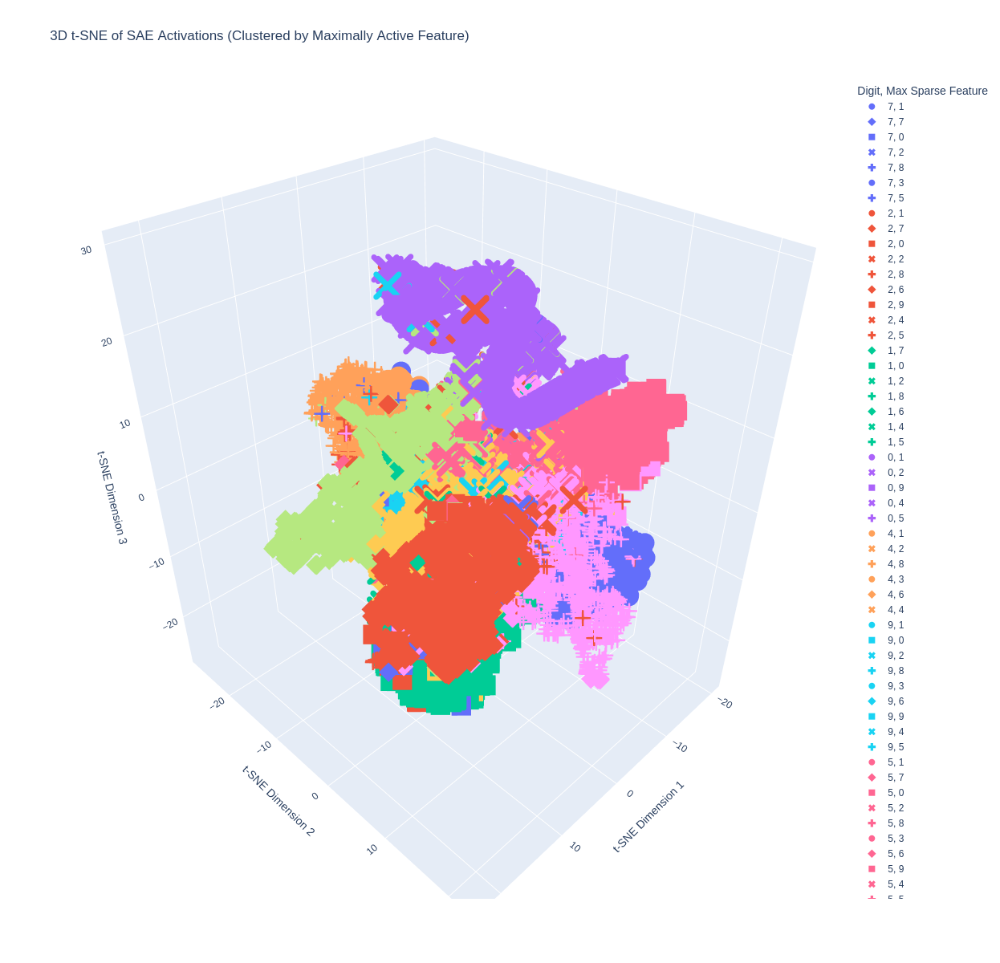

In [40]:
tsne = TSNE(n_components=3, random_state=42)
activations_3d = tsne.fit_transform(hidden_activations_one)

kmeans = KMeans(n_clusters=10, random_state=42)
cluster_labels = kmeans.fit_predict(hidden_activations_one)

SNE_plot_3d(activations_3d, labels, cluster_labels)

### 2D Sparse Layer One

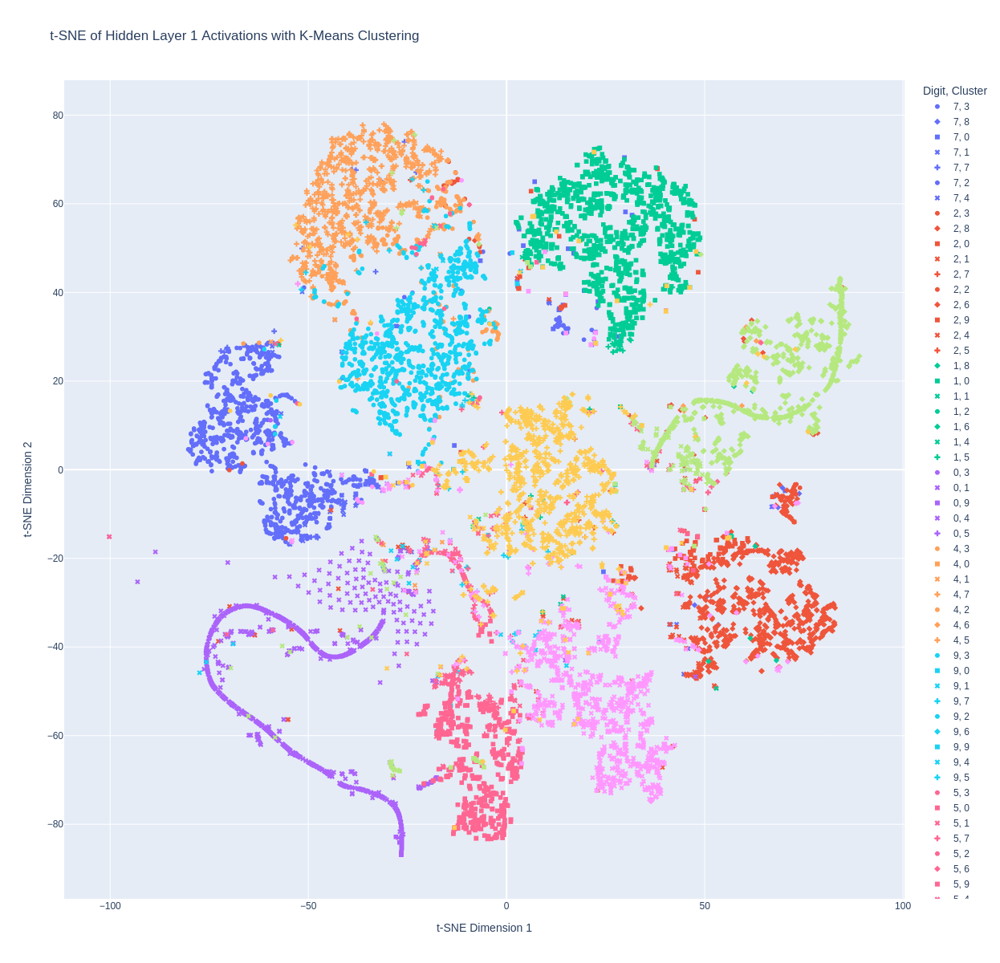

In [27]:
tsne = TSNE(n_components=2, random_state=42)
activations_2d = tsne.fit_transform(sparse_act_one)

kmeans = KMeans(n_clusters=10, random_state=42)
cluster_labels = kmeans.fit_predict(sparse_act_one)

SNE_plot_2d(activations_2d, labels, cluster_labels)

### 3D Sparse Layer One

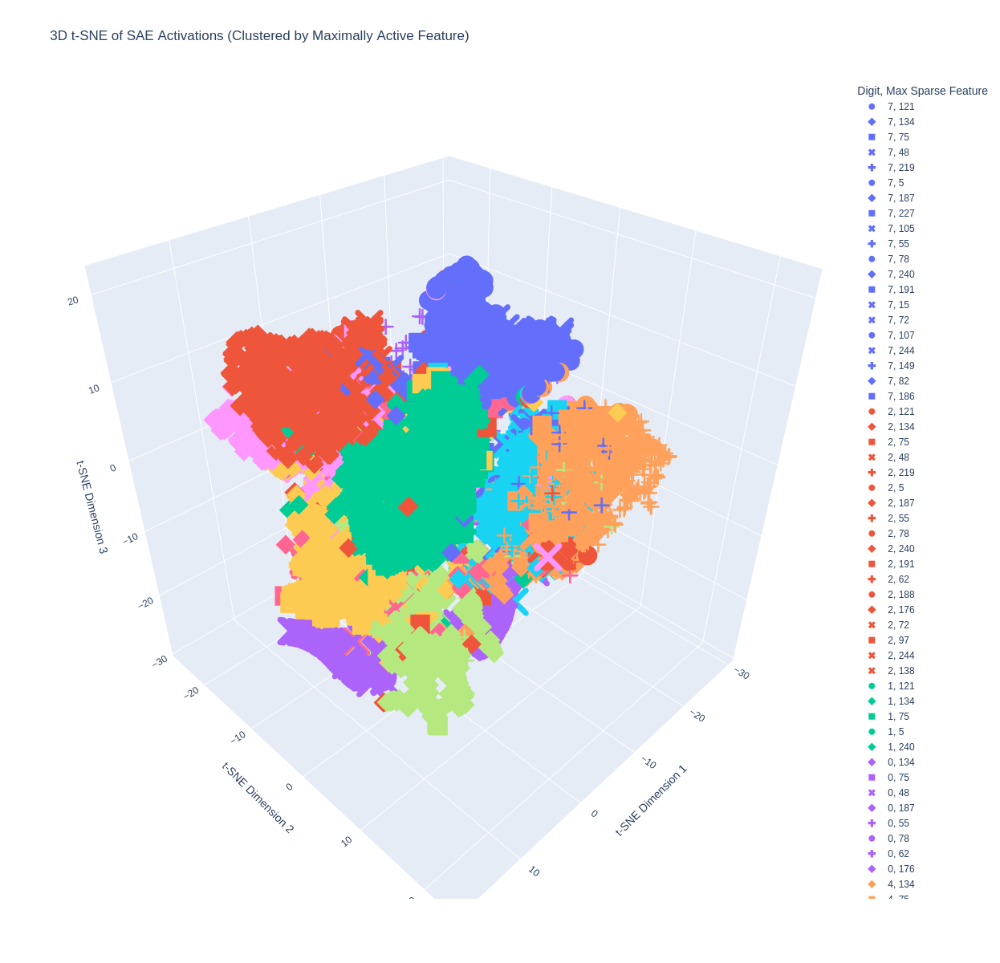

In [28]:
tsne = TSNE(n_components=3, random_state=42)
activations_3d = tsne.fit_transform(sparse_act_one)

SNE_plot_3d(activations_3d, labels, max_feature_indices_sp_one)

# Use Clustering To Minimally Reconstruct an Answer

In [29]:
digit_7_mask = labels == 7
feature_78_max = np.max(sparse_act_one[digit_7_mask, 78]) if np.sum(digit_7_mask) > 0 else 1.0
feature_121_max = np.max(sparse_act_one[digit_7_mask, 121]) if np.sum(digit_7_mask) > 0 else 1.0
print(f"Max activation for feature 78 (digit 7): {feature_78_max:.4f}")
print(f"Max activation for feature 121 (digit 7): {feature_121_max:.4f}")

Max activation for feature 78 (digit 7): 292.3915
Max activation for feature 121 (digit 7): 379.1620


In [30]:
sae_hidden_dim = sparse_act_one.shape[1]
encoded_78 = np.zeros(sae_hidden_dim)
encoded_78[78] = feature_78_max
encoded_121 = np.zeros(sae_hidden_dim)
encoded_121[121] = feature_121_max

In [31]:
encoded_78_torch = torch.from_numpy(encoded_78).float().to(device).unsqueeze(0)
encoded_121_torch = torch.from_numpy(encoded_121).float().to(device).unsqueeze(0)
with torch.no_grad():
    recon_hidden_78 = best_sae_one.decoder(encoded_78_torch)
    recon_hidden_121 = best_sae_one.decoder(encoded_121_torch)

In [32]:
with torch.no_grad():
    # Ensure recon_hidden_78/121 are flattened and have correct shape
    recon_hidden_78 = recon_hidden_78.view(1, -1)  # Shape: [1, hidden_dim]
    recon_hidden_121 = recon_hidden_121.view(1, -1)

    # Forward pass through remaining layers (e.g., fc1)
    # Adjust based on your model’s architecture
    hidden_two_78 = best_model.hidden_two(recon_hidden_78)
    hidden_two_121 = best_model.hidden_two(recon_hidden_121)

    classification_out_78 = best_model.classification_layer(hidden_two_78)
    classification_out_121 = best_model.classification_layer(hidden_two_121)

    # Get predicted classes and probabilities
    probs_combined = torch.softmax(classification_out_78 + classification_out_121, dim=1)
    probs_78 = torch.softmax(classification_out_78, dim=1)
    probs_121 = torch.softmax(classification_out_121, dim=1)

    _, predicted_combined = torch.max(classification_out_78 + classification_out_121, 1)
    _, predicted_78 = torch.max(classification_out_78, 1)
    _, predicted_121 = torch.max(classification_out_121, 1)

print("\nClassification for combined (78 + 121):")
print(f"Predicted digit: {predicted_combined.item()}")
print(f"Probabilities: {probs_combined.cpu().numpy().flatten()}")

print("\nClassification for feature 78:")
print(f"Predicted digit: {predicted_78.item()}")
print(f"Probabilities: {probs_78.cpu().numpy().flatten()}")

print("\nClassification for feature 121:")
print(f"Predicted digit: {predicted_121.item()}")
print(f"Probabilities: {probs_121.cpu().numpy().flatten()}")


Classification for combined (78 + 121):
Predicted digit: 9
Probabilities: [9.1242377e-32 6.5998002e-03 1.7439212e-09 5.4852568e-12 1.3916952e-22
 4.2042250e-23 1.8213427e-28 4.8246915e-05 3.2358283e-09 9.9335194e-01]

Classification for feature 78:
Predicted digit: 9
Probabilities: [1.1312332e-20 9.7143584e-06 3.1070340e-06 7.8869768e-08 4.4855583e-15
 1.7607082e-16 9.3283058e-20 1.2751030e-05 6.8932066e-05 9.9990547e-01]

Classification for feature 121:
Predicted digit: 1
Probabilities: [1.17891748e-14 9.93016481e-01 8.20388948e-07 1.01654415e-07
 4.53488844e-11 3.49010432e-10 2.85382850e-12 5.53048542e-03
 6.86124721e-08 1.45205681e-03]


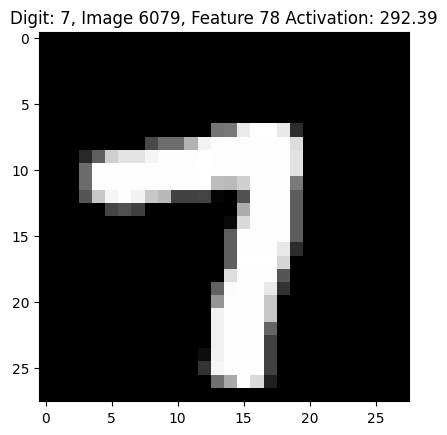

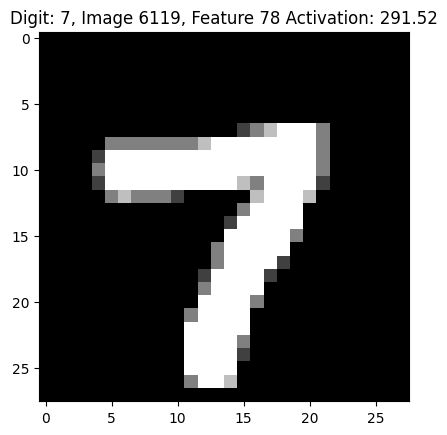

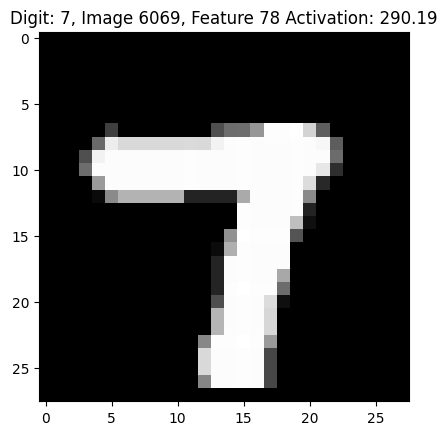

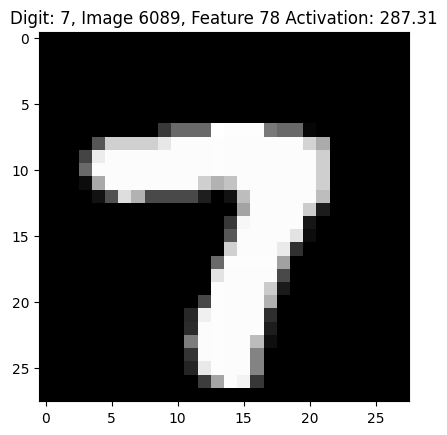

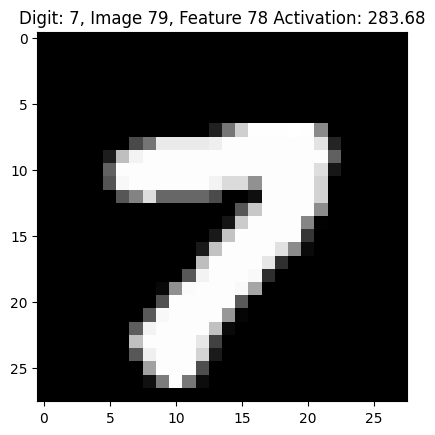

...

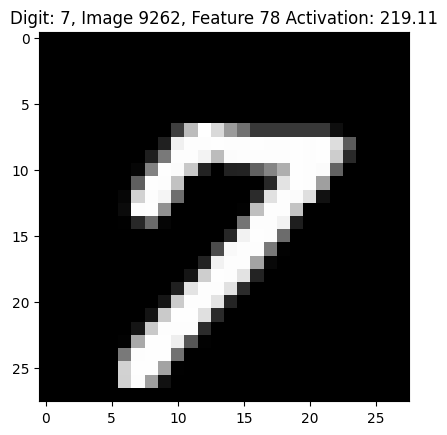

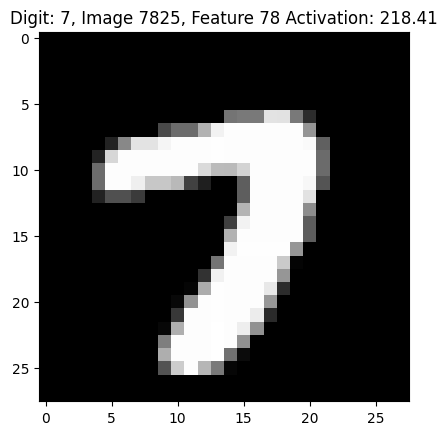

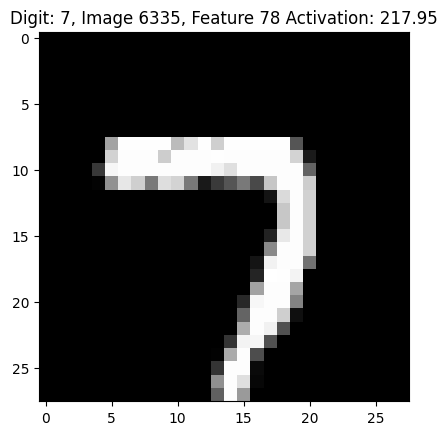

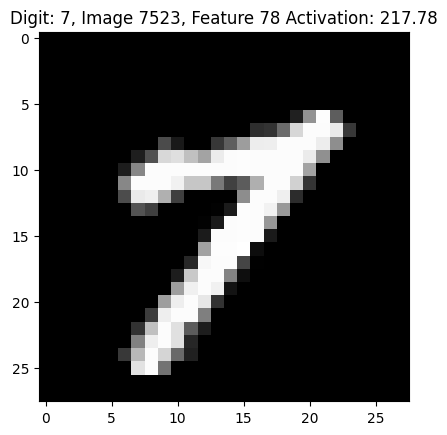

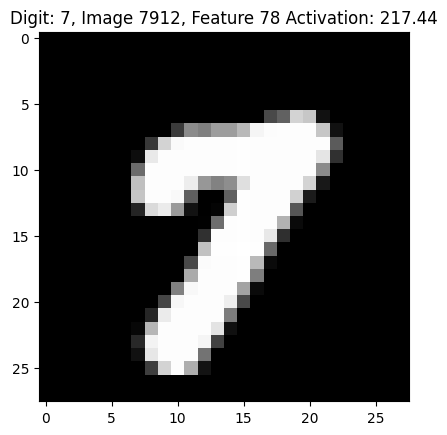

In [33]:
# Find top images for feature 78
top_78_indices = np.argsort(sparse_act_one[:, 78])[::-1][:50]  # Top 5
for idx in top_78_indices:
    plt.imshow(test_images[idx].reshape(28, 28), cmap='gray')
    plt.title(f"Digit: {labels[idx]}, Image {idx}, Feature 78 Activation: {sparse_act_one[idx, 78]:.2f}")
    plt.show()

Feature 78 seems tied to curvy 7s.

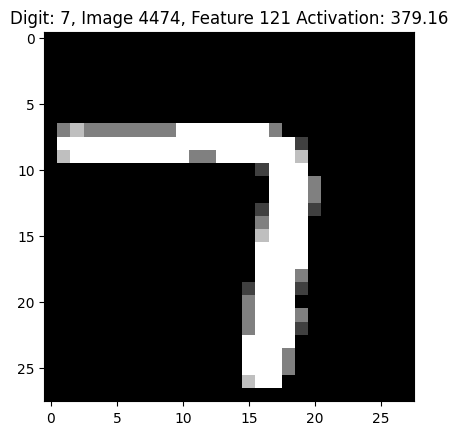

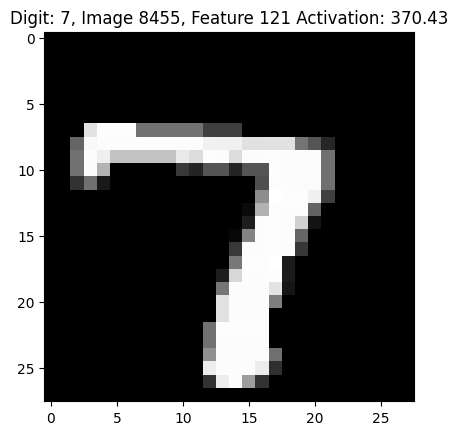

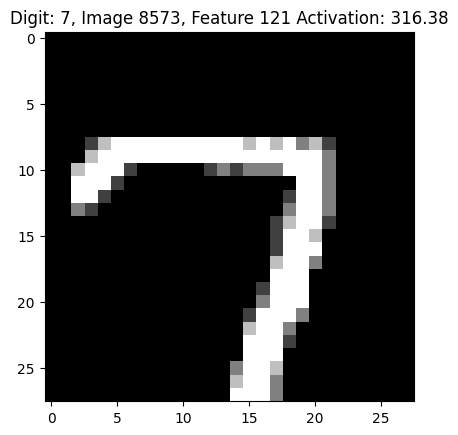

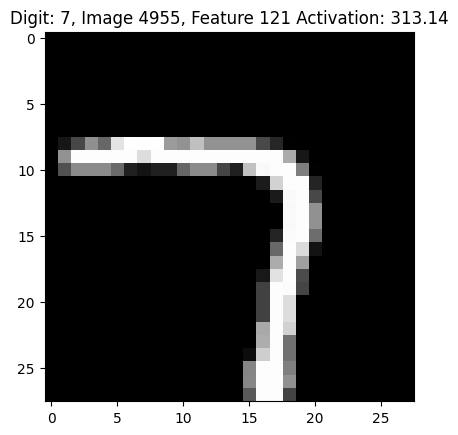

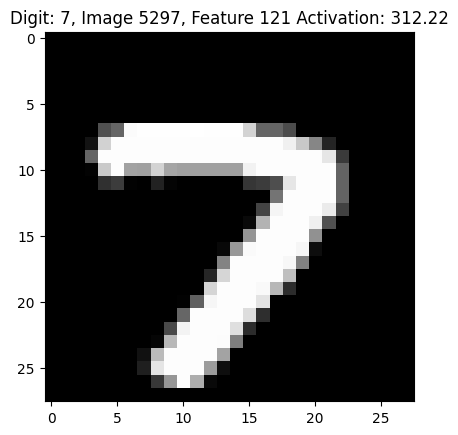

...

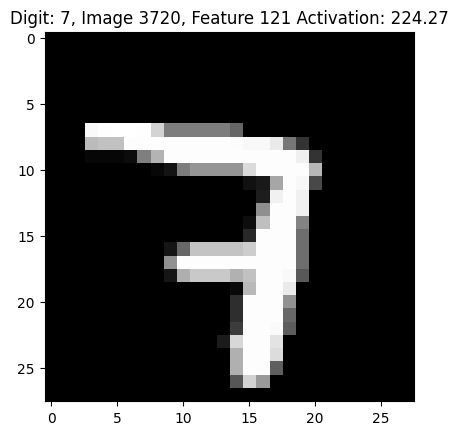

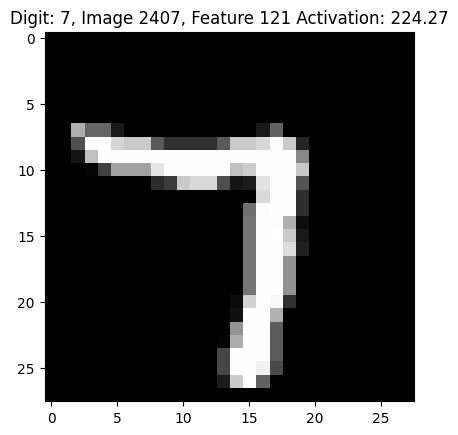

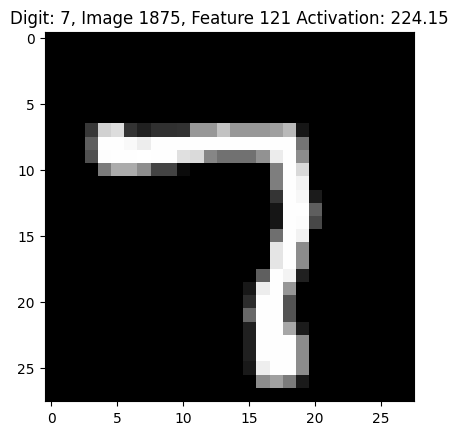

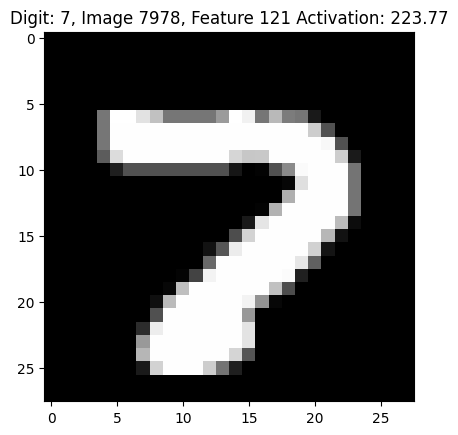

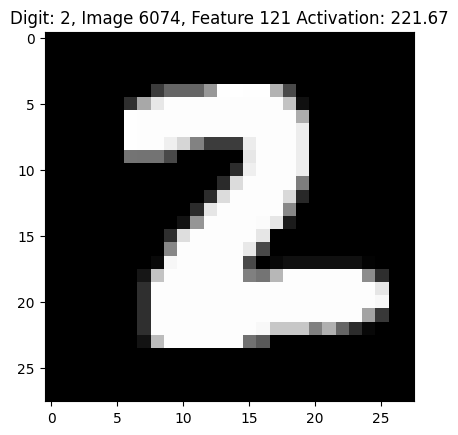

In [34]:
# Same for feature 121
top_121_indices = np.argsort(sparse_act_one[:, 121])[::-1][:50]
for idx in top_121_indices:
    plt.imshow(test_images[idx].reshape(28, 28), cmap='gray')
    plt.title(f"Digit: {labels[idx]}, Image {idx}, Feature 121 Activation: {sparse_act_one[idx, 121]:.2f}")
    plt.show()

Feature 121 seems tied to straighter 7s.

In [35]:
for digit in range(10):
    mask = labels == digit
    mean_78 = np.mean(sparse_act_one[mask, 78]) if np.sum(mask) > 0 else 0
    mean_121 = np.mean(sparse_act_one[mask, 121]) if np.sum(mask) > 0 else 0
    count = np.sum(mask)
    print(f"Digit {digit} (n={count}): Mean activation for feature 78: {mean_78:.4f}, feature 121: {mean_121:.4f}")

Digit 0 (n=980): Mean activation for feature 78: 0.3213, feature 121: 0.5748
Digit 1 (n=1135): Mean activation for feature 78: 76.4357, feature 121: 20.4508
Digit 2 (n=1032): Mean activation for feature 78: 6.6838, feature 121: 69.1404
Digit 3 (n=1010): Mean activation for feature 78: 5.4856, feature 121: 69.1386
Digit 4 (n=982): Mean activation for feature 78: 20.9829, feature 121: 6.6188
Digit 5 (n=892): Mean activation for feature 78: 4.6002, feature 121: 1.5460
Digit 6 (n=958): Mean activation for feature 78: 1.3704, feature 121: 0.1502
Digit 7 (n=1028): Mean activation for feature 78: 123.2549, feature 121: 115.1431
Digit 8 (n=974): Mean activation for feature 78: 11.1827, feature 121: 2.3210
Digit 9 (n=1009): Mean activation for feature 78: 73.7897, feature 121: 5.3421


Features 78 and 121 do activate for 7s much more on average than for other digits.

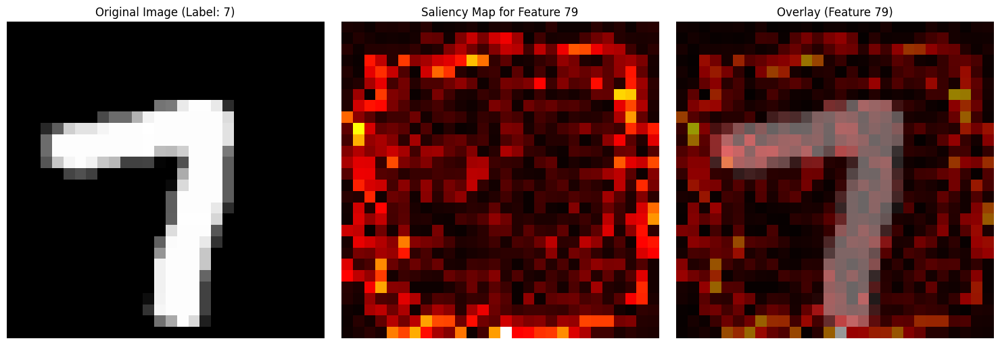

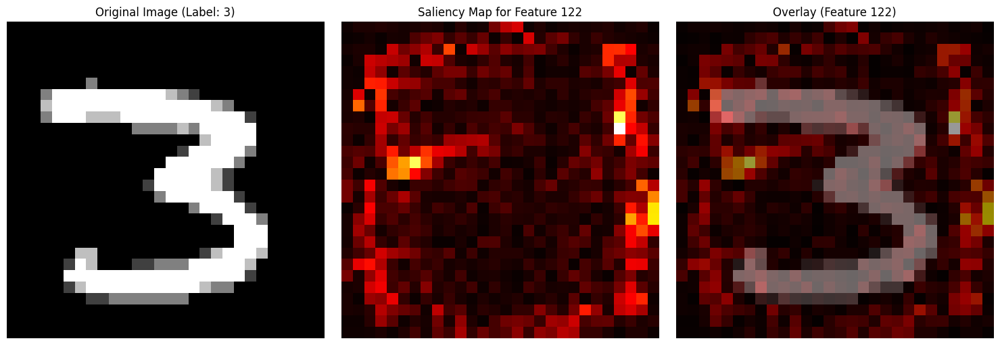

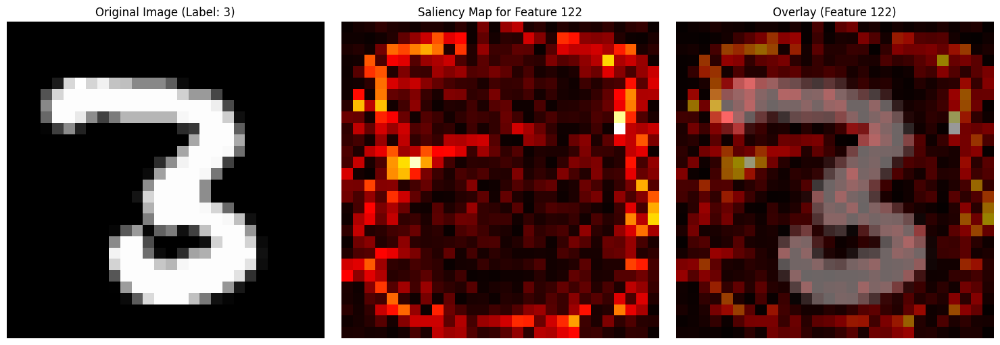

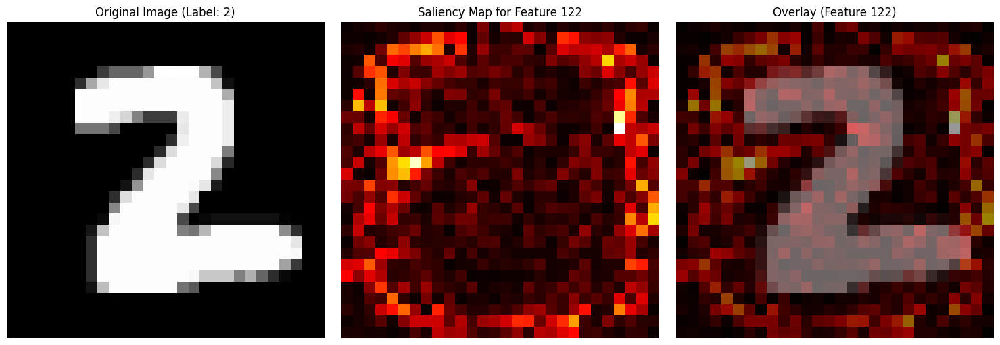

In [36]:
plot_saliency_map(6079, 78, best_model, best_sae_one, test_dataset, HIDDEN_SIZE, device)
plot_saliency_map(792, 121, best_model, best_sae_one, test_dataset, HIDDEN_SIZE, device)
plot_saliency_map(9163, 121, best_model, best_sae_one, test_dataset, HIDDEN_SIZE, device)
plot_saliency_map(6074, 121, best_model, best_sae_one, test_dataset, HIDDEN_SIZE, device)

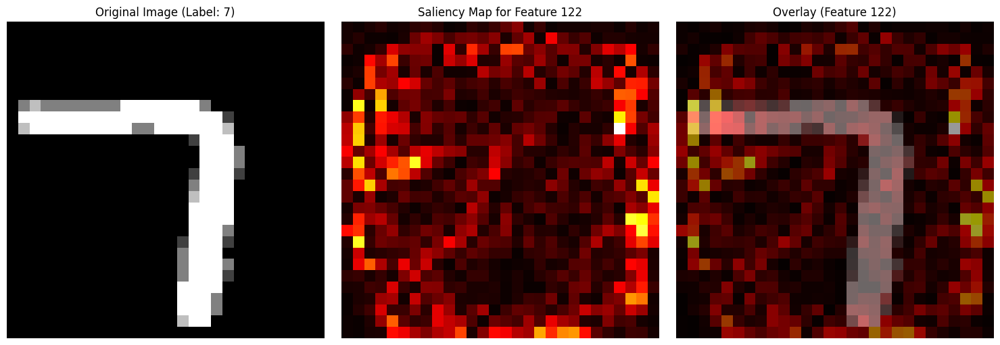

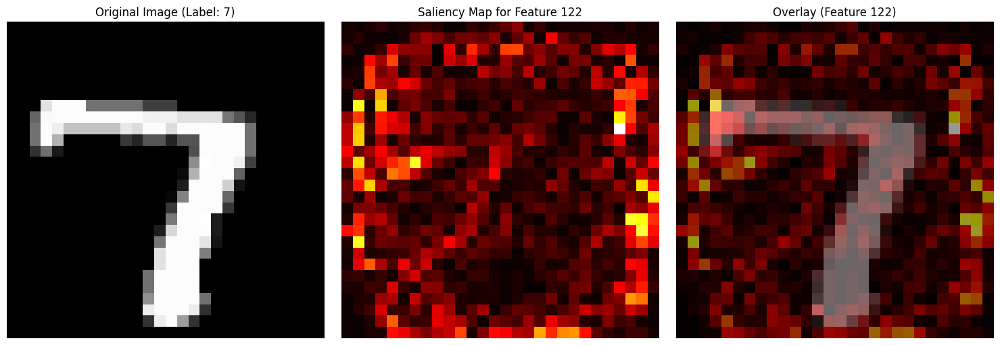

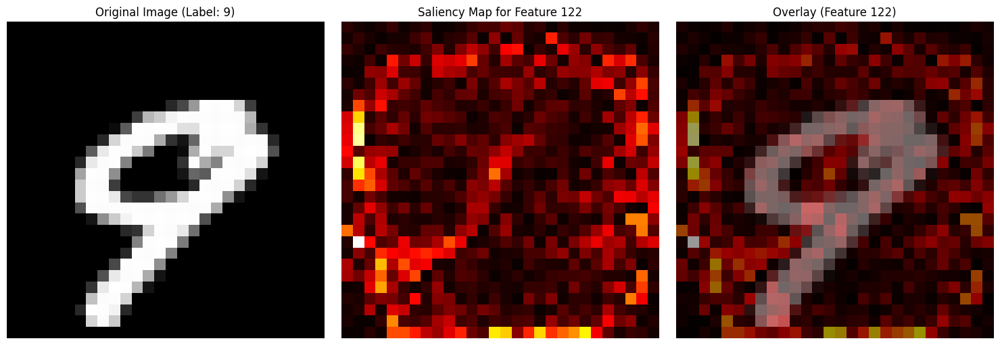

In [37]:
plot_saliency_map(4474, 121, best_model, best_sae_one, test_dataset, HIDDEN_SIZE, device)
plot_saliency_map(8455, 121, best_model, best_sae_one, test_dataset, HIDDEN_SIZE, device)
plot_saliency_map(9245, 121, best_model, best_sae_one, test_dataset, HIDDEN_SIZE, device)

Unfortunately, the saliency maps are not helping us get much from the potentially unique features that are causing the clustering above.

They still are really noisy and messy.

Feature 78 with high activation:


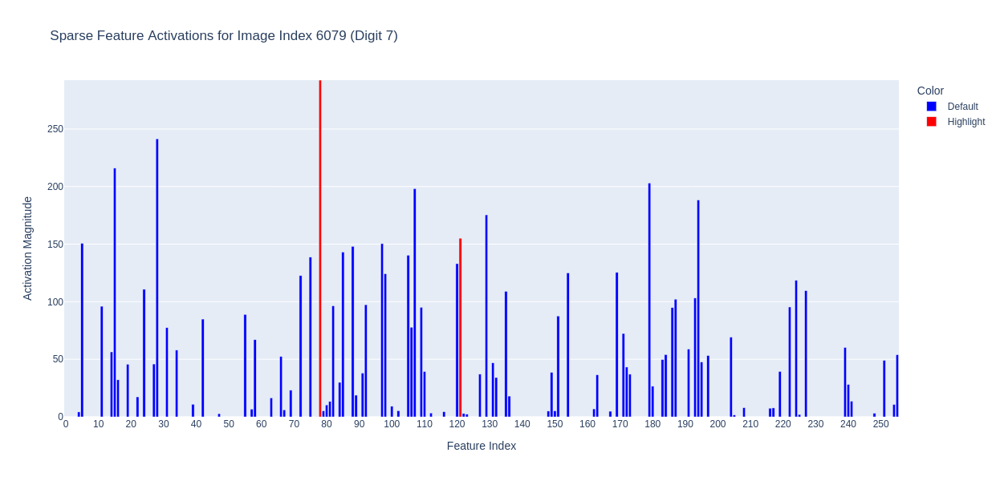

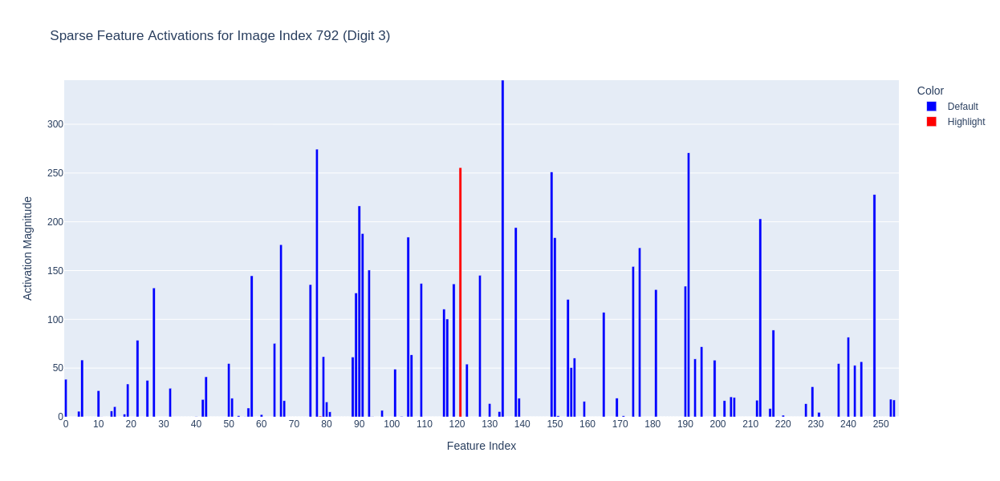

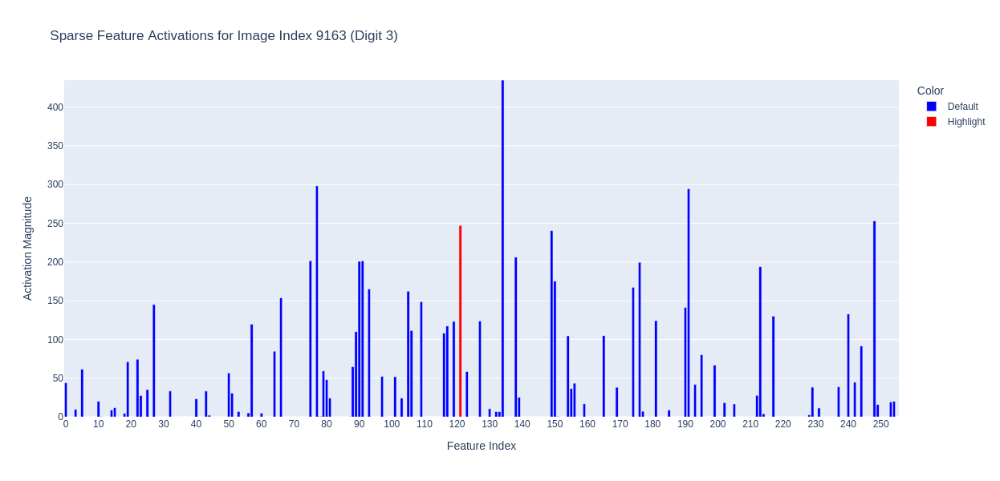

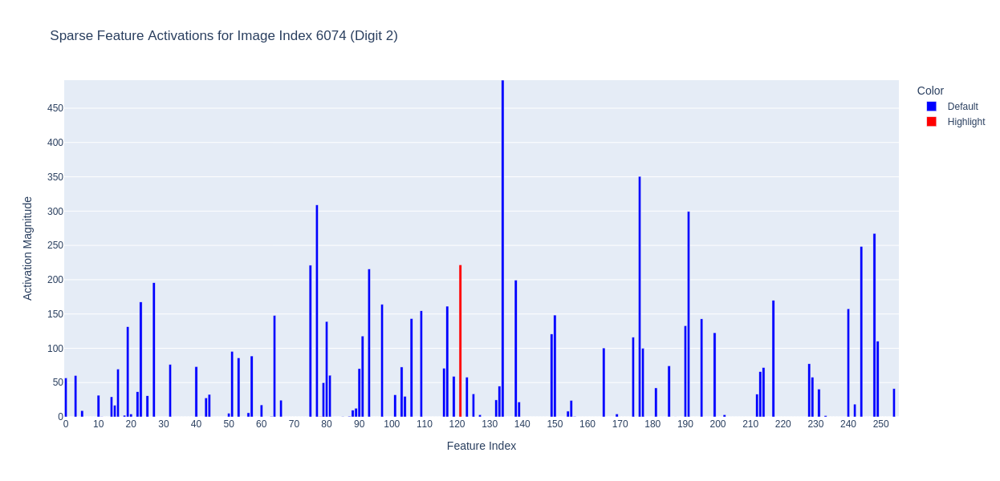

Feature 121 with high activation:


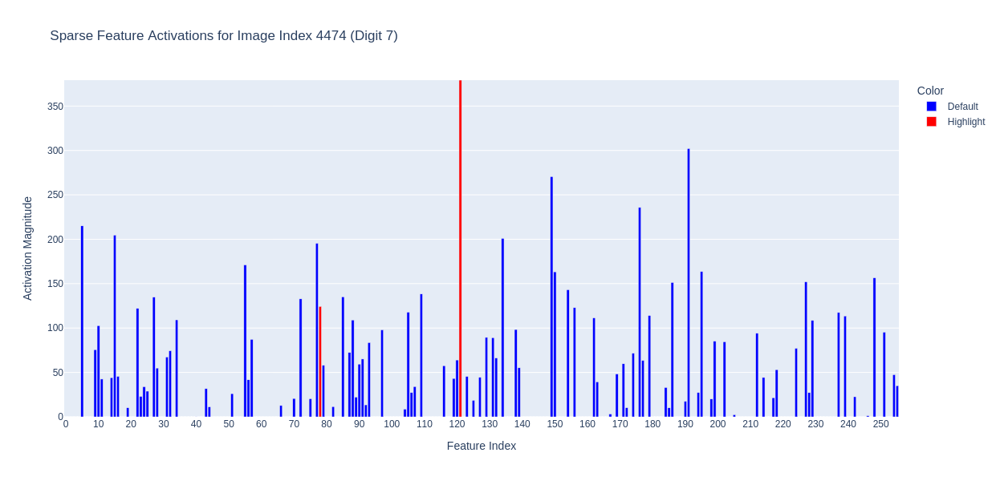

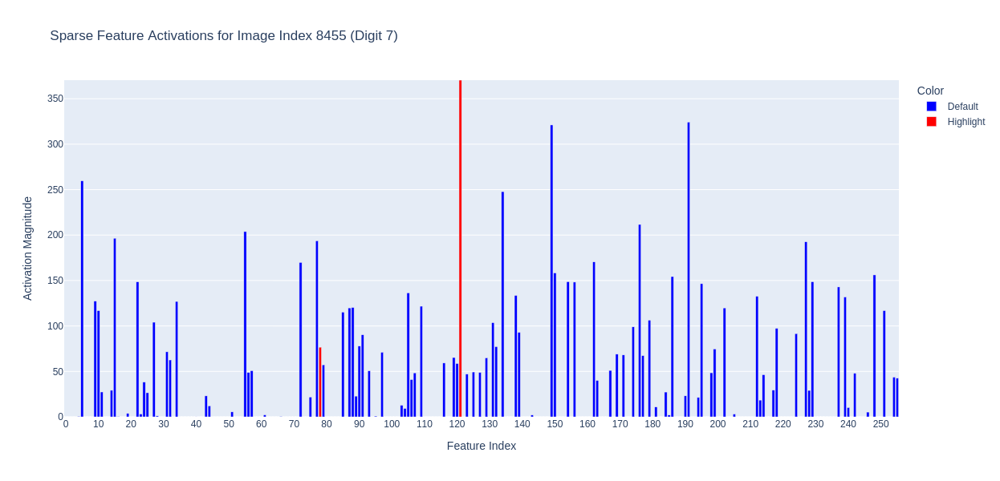

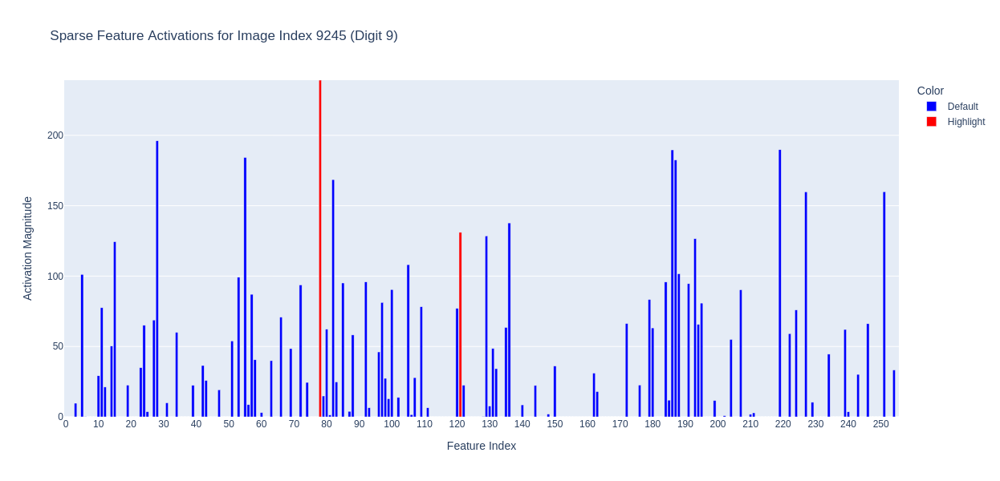

In [41]:
print("Feature 78 with high activation:")
for idx in [6079, 792, 9163, 6074]:
    encoding = sparse_act_one[idx]
    digit_label = labels[idx]
    plot_sparse_features(encoding, idx, digit_label, HIDDEN_SIZE)

print("Feature 121 with high activation:")
for idx in [4474, 8455, 9245]:
    encoding = sparse_act_one[idx]
    digit_label = labels[idx]
    plot_sparse_features(encoding, idx, digit_label, HIDDEN_SIZE)

The depiction of the sparse vector at hidden layer one.

In [44]:
feature_15_digit_6079 = sparse_act_one[6079, 15]
feature_28_digit_6079 = sparse_act_one[6079, 28]
feature_78_digit_6079 = sparse_act_one[6079, 78]
feature_107_digit_6079 = sparse_act_one[6079, 107]
feature_179_digit_6079 = sparse_act_one[6079, 179]
feature_129_digit_6079 = sparse_act_one[6079, 129]
feature_194_digit_6079 = sparse_act_one[6079, 194]

In [42]:
def pass_sparse_vector(encoded_vector, idx, device, hidden_dims, best_model, best_sae_one):
    encoded_digit_torch = torch.from_numpy(encoded_vector).float().to(device).unsqueeze(0)
    with torch.no_grad():
        recon_hidden_6079 = best_sae_one.decoder(encoded_digit_torch)
        recon_hidden_6079 = recon_hidden_6079.view(1, -1)
    
        hidden_two = best_model.hidden_two(recon_hidden_6079)
        classification_out = best_model.classification_layer(hidden_two)
    
        probs = torch.softmax(classification_out, dim=1)
        _, pred = torch.max(classification_out, 1)
    
    print("Classification for our encoded vector:")
    print(f"Predicted digit: {pred.item()}")
    print(f"Probabilities: {probs.cpu().numpy().flatten()}")
    
    plot_sparse_features(encoded_vector, idx, "Encoded", hidden_dims)

### An attempt to classify a 7 from the minimum key features in the sparse vector:

Classification for our encoded vector:
Predicted digit: 9
Probabilities: [1.1312332e-20 9.7143584e-06 3.1070340e-06 7.8869768e-08 4.4855583e-15
 1.7607082e-16 9.3283058e-20 1.2751030e-05 6.8932066e-05 9.9990547e-01]


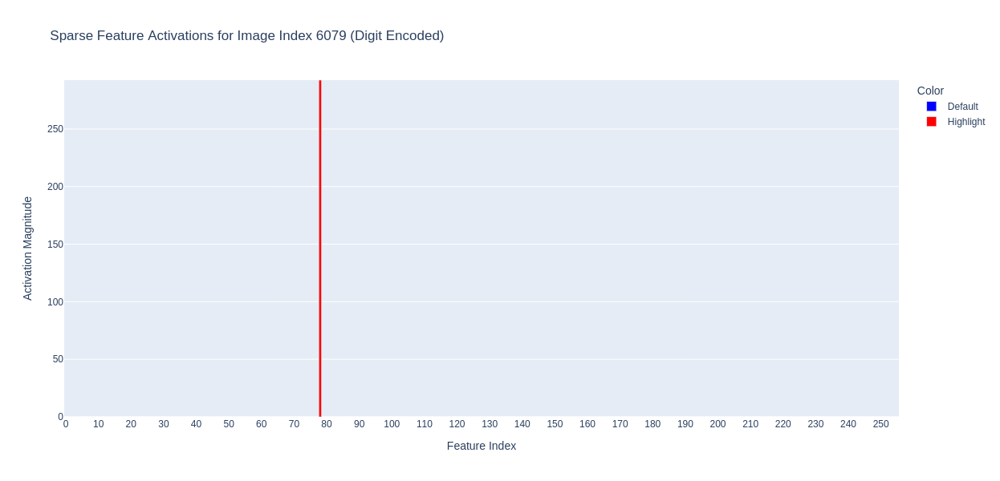

Classification for our encoded vector:
Predicted digit: 9
Probabilities: [2.2687880e-35 6.7002465e-10 2.4096227e-09 1.7062529e-12 5.5911183e-24
 6.5538943e-28 4.7175592e-32 1.5501385e-09 7.4735108e-06 9.9999249e-01]


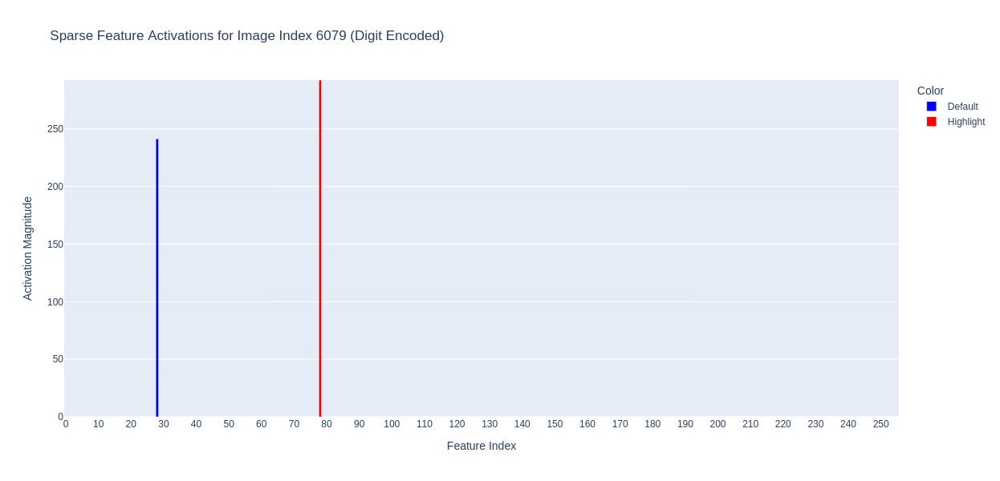

Classification for our encoded vector:
Predicted digit: 9
Probabilities: [4.3440252e-44 1.4431056e-09 1.7752381e-11 2.0802549e-15 1.1423941e-28
 5.8282456e-34 2.0255411e-38 7.9961410e-10 1.5159040e-07 9.9999988e-01]


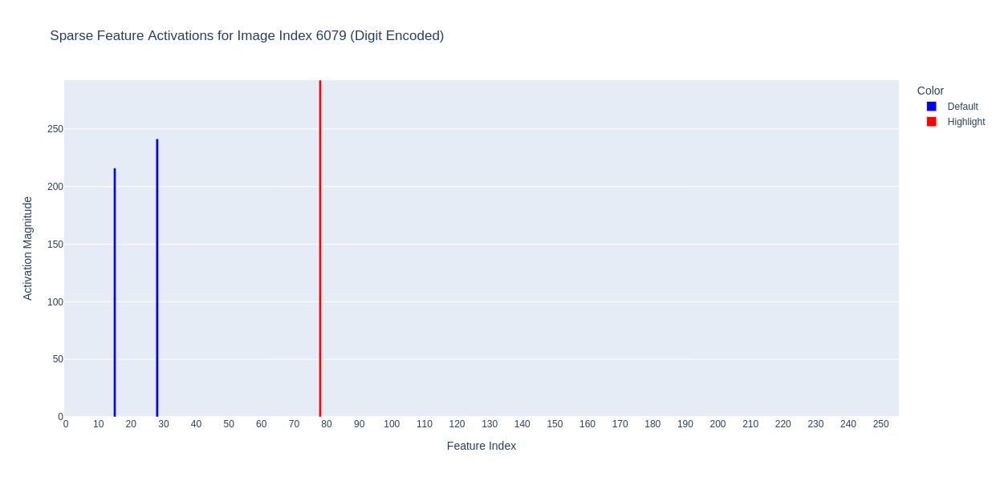

Classification for our encoded vector:
Predicted digit: 9
Probabilities: [0.0000000e+00 5.0298660e-10 1.9430854e-13 5.3705661e-18 3.4517785e-34
 1.3200374e-38 3.5032462e-44 1.2005588e-11 1.2523252e-08 1.0000000e+00]


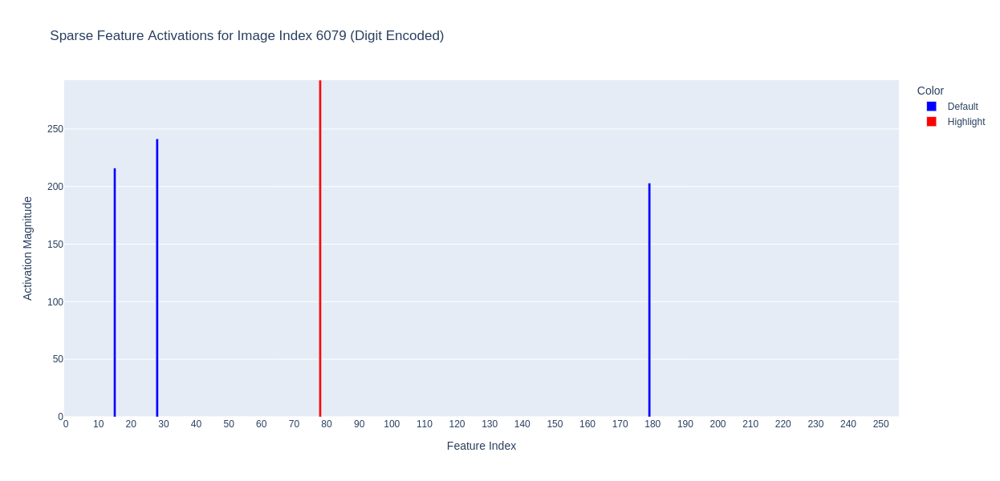

Classification for our encoded vector:
Predicted digit: 9
Probabilities: [0.0000000e+00 2.9927766e-10 1.3869696e-16 6.7894138e-20 1.9422095e-37
 2.8676853e-37 0.0000000e+00 2.3057575e-11 5.4852233e-13 1.0000000e+00]


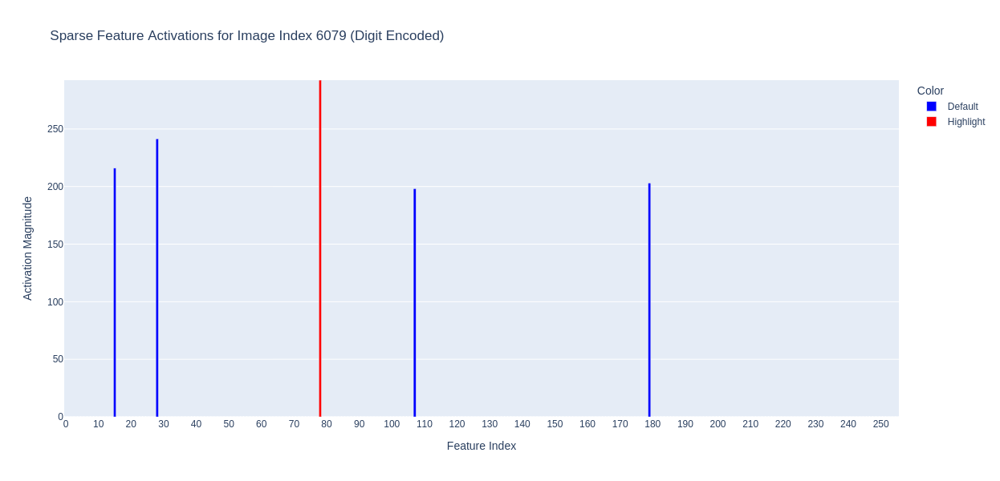

Classification for our encoded vector:
Predicted digit: 9
Probabilities: [0.0000000e+00 2.6000093e-11 7.5990022e-19 4.2133534e-23 4.7644148e-44
 2.8025969e-44 0.0000000e+00 5.0301077e-13 1.5955233e-14 1.0000000e+00]


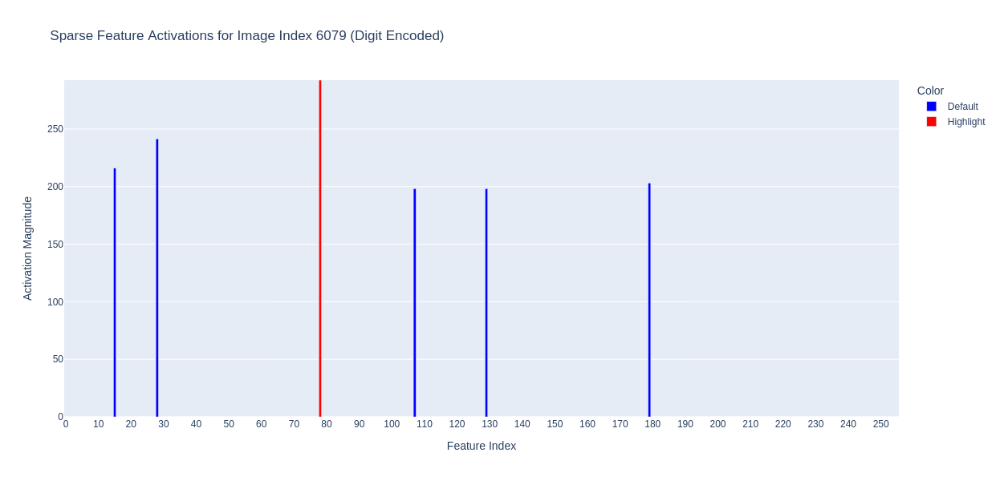

Classification for our encoded vector:
Predicted digit: 9
Probabilities: [0.0000000e+00 2.4535662e-12 2.0995736e-21 1.4910116e-25 0.0000000e+00
 2.5223372e-44 0.0000000e+00 1.5041092e-12 2.0202065e-18 1.0000000e+00]


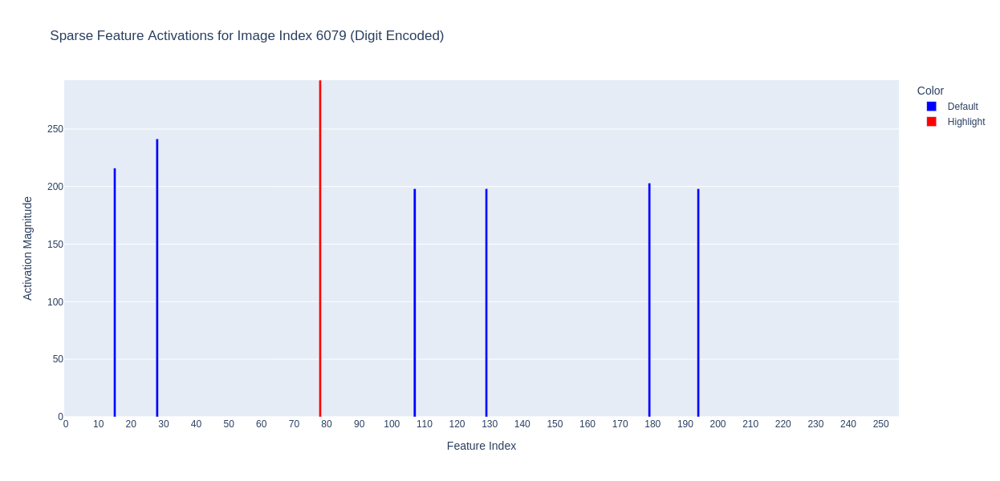

In [46]:
idx = 6079
encoded_digit_6079 = np.zeros(sae_hidden_dim)

encoded_digit_6079[78] = feature_78_digit_6079
pass_sparse_vector(encoded_digit_6079, idx, device, HIDDEN_SIZE, best_model, best_sae_one)

encoded_digit_6079[28] = feature_28_digit_6079
pass_sparse_vector(encoded_digit_6079, idx, device, HIDDEN_SIZE, best_model, best_sae_one)

encoded_digit_6079[15] = feature_15_digit_6079
pass_sparse_vector(encoded_digit_6079, idx, device, HIDDEN_SIZE, best_model, best_sae_one)

encoded_digit_6079[179] = feature_179_digit_6079
pass_sparse_vector(encoded_digit_6079, idx, device, HIDDEN_SIZE, best_model, best_sae_one)

encoded_digit_6079[107] = feature_107_digit_6079
pass_sparse_vector(encoded_digit_6079, idx, device, HIDDEN_SIZE, best_model, best_sae_one)

encoded_digit_6079[129] = feature_107_digit_6079
pass_sparse_vector(encoded_digit_6079, idx, device, HIDDEN_SIZE, best_model, best_sae_one)

encoded_digit_6079[194] = feature_107_digit_6079
pass_sparse_vector(encoded_digit_6079, idx, device, HIDDEN_SIZE, best_model, best_sae_one)

Classification for our encoded vector:
Predicted digit: 1
Probabilities: [1.3872855e-43 1.0000000e+00 9.7071726e-23 1.6655225e-16 2.7995281e-40
 6.1334981e-25 2.2322685e-42 8.7167445e-21 3.6195697e-13 8.7504386e-11]


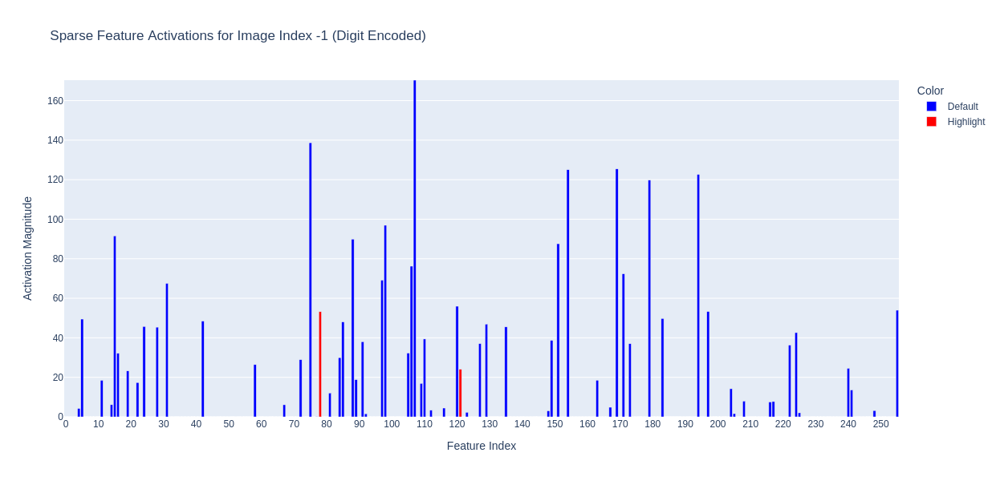

In [49]:
diff = sparse_act_one[6079] - sparse_act_one[9245]
pass_sparse_vector(diff, -1, device, HIDDEN_SIZE, best_model, best_sae_one)

I think this is why it was so difficult to differentiate a 7 and 9 from features 78 and 121. As we can see with the highlighted features above, there's not a big difference b/w the two.

Classification for our encoded vector:
Predicted digit: 5
Probabilities: [2.1934399e-01 1.5069712e-03 2.7095502e-06 1.3352778e-04 2.8418438e-06
 7.6158422e-01 2.8734990e-05 7.8589143e-03 1.8140240e-07 9.5378961e-03]


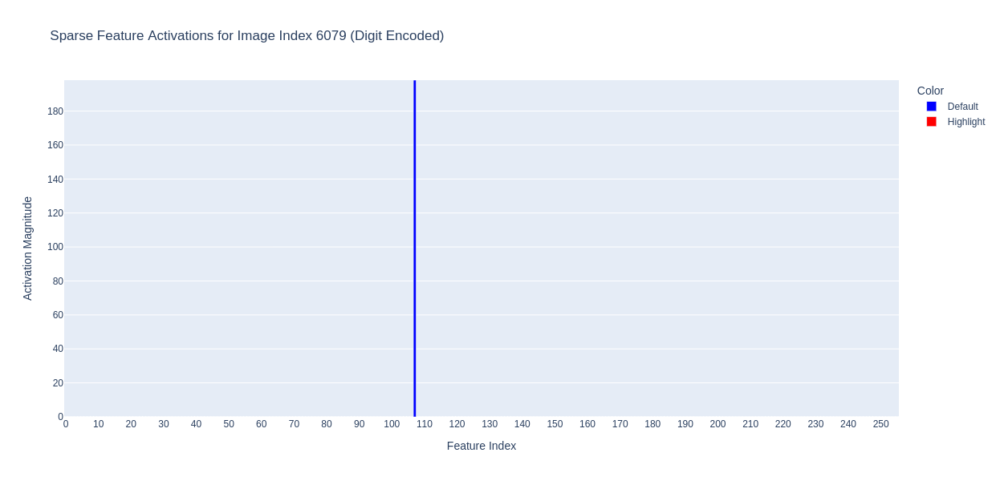

Classification for our encoded vector:
Predicted digit: 9
Probabilities: [1.5338219e-04 3.3149725e-01 3.1366287e-04 1.3425434e-02 2.2020804e-06
 1.2999235e-03 1.0160810e-07 3.6457882e-03 9.1971504e-03 6.4046508e-01]


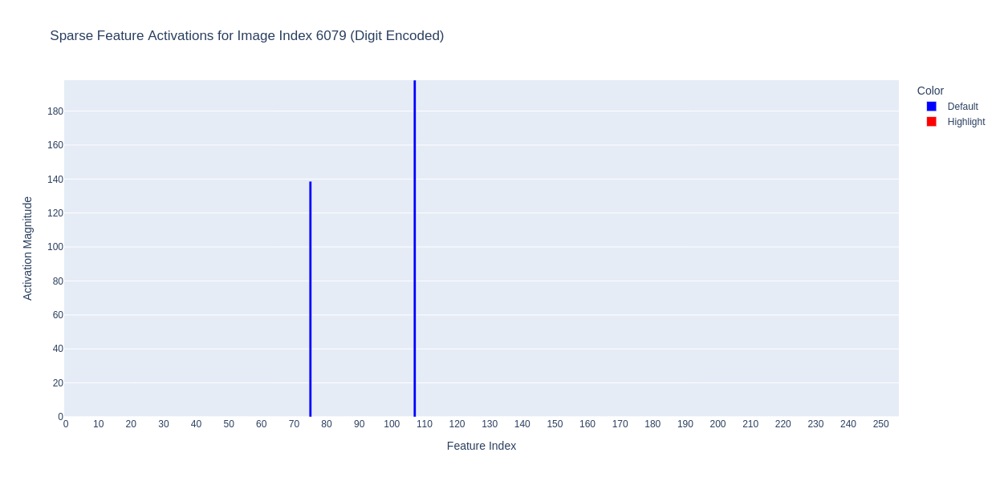

Classification for our encoded vector:
Predicted digit: 1
Probabilities: [1.9620353e-07 8.0048186e-01 5.7010070e-06 3.8170317e-04 5.3014877e-09
 4.7938091e-05 2.2822898e-10 4.1646441e-03 7.5896300e-05 1.9484217e-01]


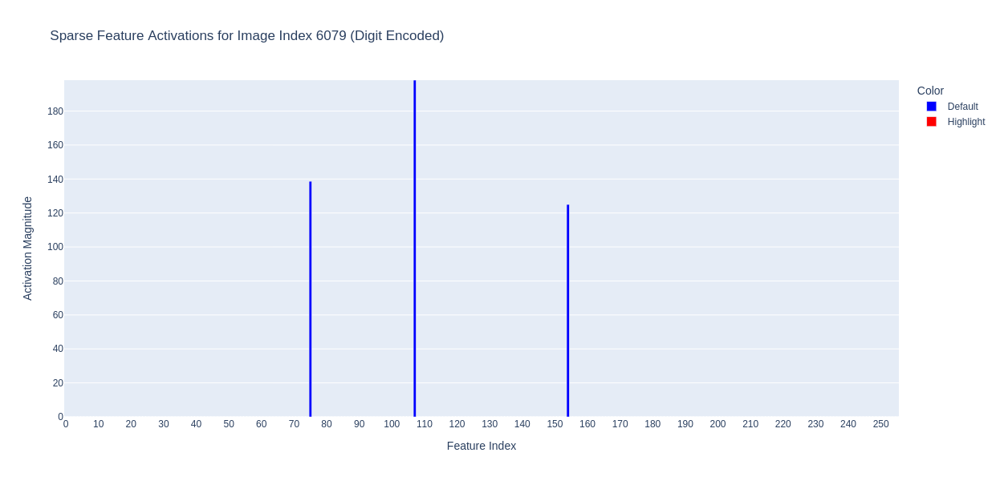

Classification for our encoded vector:
Predicted digit: 1
Probabilities: [8.6947716e-10 9.2608231e-01 3.6893343e-06 1.7067243e-04 1.5670749e-11
 5.4444907e-08 2.4905579e-13 2.3147870e-04 1.0673000e-03 7.2444558e-02]


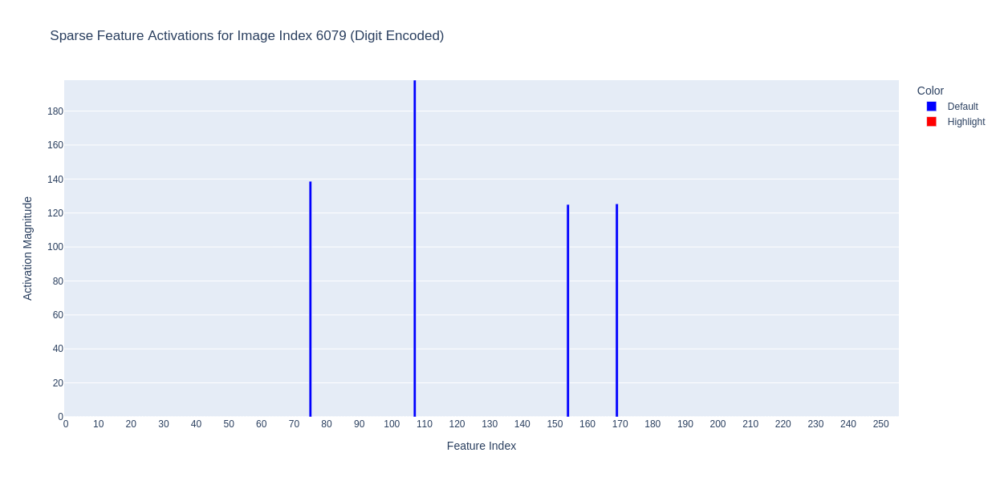

In [47]:
idx = 6079
encoded_digit_6079 = np.zeros(sae_hidden_dim)
# encoded_digit_6079[78] = feature_78_digit_6079
# pass_sparse_vector(encoded_digit_6079, device, HIDDEN_SIZE, best_model, best_sae_one)

encoded_digit_6079[107] = sparse_act_one[idx, 107]
pass_sparse_vector(encoded_digit_6079, idx, device, HIDDEN_SIZE, best_model, best_sae_one)

encoded_digit_6079[75] = sparse_act_one[idx, 75]
pass_sparse_vector(encoded_digit_6079, idx, device, HIDDEN_SIZE, best_model, best_sae_one)

encoded_digit_6079[154] = sparse_act_one[idx, 154]
pass_sparse_vector(encoded_digit_6079, idx, device, HIDDEN_SIZE, best_model, best_sae_one)

encoded_digit_6079[169] = sparse_act_one[idx, 169]
pass_sparse_vector(encoded_digit_6079, idx, device, HIDDEN_SIZE, best_model, best_sae_one)

Although, as we can see here, even using the more distinguished features from the 7 and 9 diff, these few subfeatures don't construct a 7.

# Finding Minimum Sparse Features to Classify 7

In [60]:
for i in range(HIDDEN_SIZE):
    sparse_feature_value = np.max(sparse_act_one[:, i])
    sparse_vector = np.zeros(sae_hidden_dim)
    sparse_vector[i] = sparse_feature_value
    sparse_vector_torch = torch.from_numpy(sparse_vector).float().to(device).unsqueeze(0)
    
    with torch.no_grad():
        recon_hidden = best_sae_one.decoder(sparse_vector_torch)
        recon_hidden = recon_hidden.view(1, -1)
    
        hidden_two = best_model.hidden_two(recon_hidden)
        classification_out = best_model.classification_layer(hidden_two)
    
        probs = torch.softmax(classification_out, dim=1)
        _, pred = torch.max(classification_out, 1)
    
    if pred == 7:
        print("\nClassification for our encoded vector:")
        print(f"Predicted digit: {pred.item()}")
        print(f"Probabilities: {probs.cpu().numpy().flatten()}")
        print(f"Sparse feature: {i}")
        print(f"Sparse feature value: {sparse_feature_value}")


Classification for our encoded vector:
Predicted digit: 7
Probabilities: [0.16458116 0.01990893 0.00900324 0.00526573 0.01519319 0.15498227
 0.13649511 0.2723153  0.00156764 0.22068742]
Sparse feature: 85
Sparse feature value: 174.782470703125

Classification for our encoded vector:
Predicted digit: 7
Probabilities: [1.6209807e-02 1.2108596e-01 1.4372705e-02 1.8950900e-02 5.3796987e-04
 1.2880428e-02 3.8752693e-04 5.4983199e-01 3.8828901e-03 2.6185983e-01]
Sparse feature: 150
Sparse feature value: 183.66636657714844

Classification for our encoded vector:
Predicted digit: 7
Probabilities: [3.8681187e-02 1.3447784e-04 6.9452506e-07 2.2844122e-06 2.9908493e-09
 3.1891186e-03 4.4768584e-09 9.3697572e-01 5.1362564e-10 2.1016583e-02]
Sparse feature: 227
Sparse feature value: 306.2187805175781


If you took the maximally activated sparse vector for each of these features you'd get 7. Or you should, let's test:

Classification for our encoded vector:
Predicted digit: 7
Probabilities: [1.3050707e-08 6.0241846e-06 7.4365475e-10 2.4364244e-10 1.1429339e-13
 6.1756219e-07 2.5910936e-13 9.9840218e-01 2.1738680e-14 1.5912412e-03]


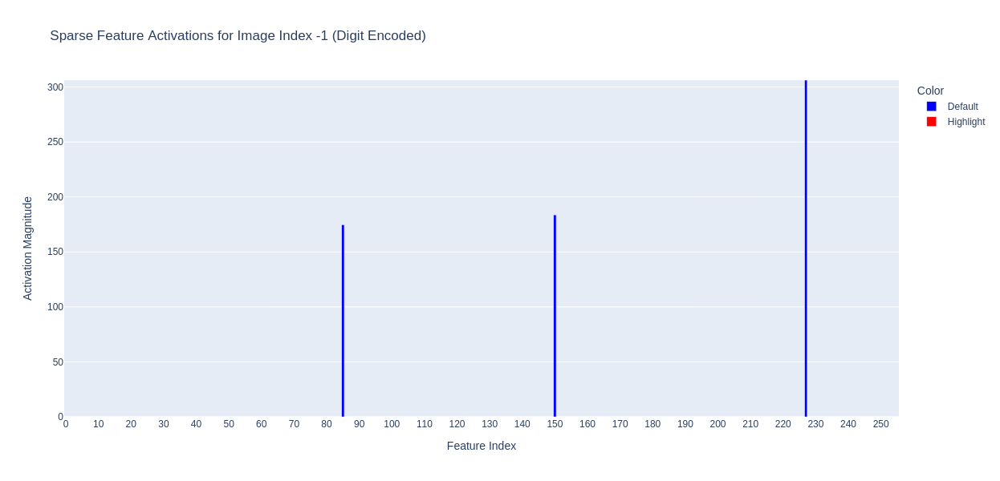

In [63]:
encoded = np.zeros(sae_hidden_dim)
encoded[85] = 174.78
encoded[150] = 183.66
encoded[227] = 306.21

pass_sparse_vector(encoded, -1, device, HIDDEN_SIZE, best_model, best_sae_one)

Seems accurate. So, with features 85, 150, and 227 maximally activating you should be able to construct a 7.

What if we just grabbed those features from an existing 7? Are they enough to construct a 7 back?

Classification for our encoded vector:
Predicted digit: 0
Probabilities: [0.3131484  0.01890144 0.01062029 0.00824009 0.01716654 0.16331227
 0.11817664 0.17556192 0.00257866 0.17229375]


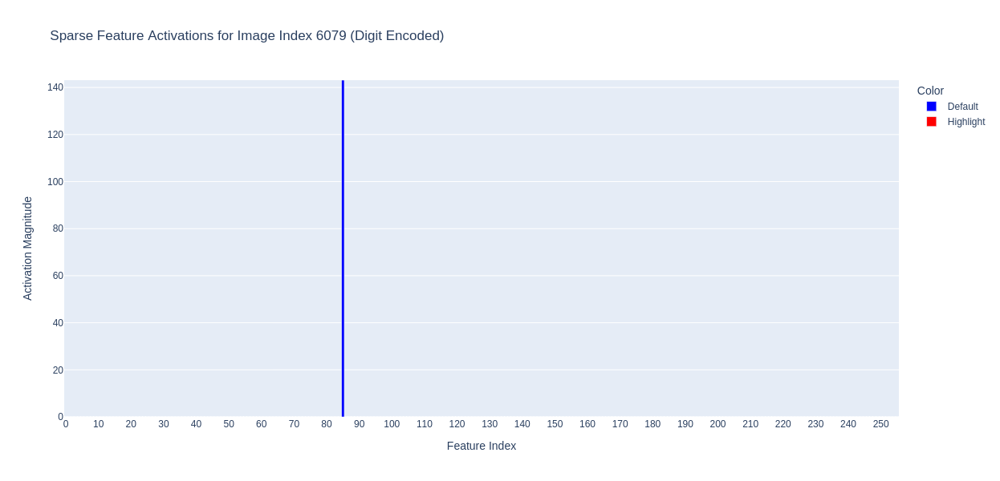

Classification for our encoded vector:
Predicted digit: 0
Probabilities: [0.28029177 0.02117792 0.01107783 0.00841589 0.0161901  0.15949854
 0.10818873 0.20252585 0.00258588 0.19004749]


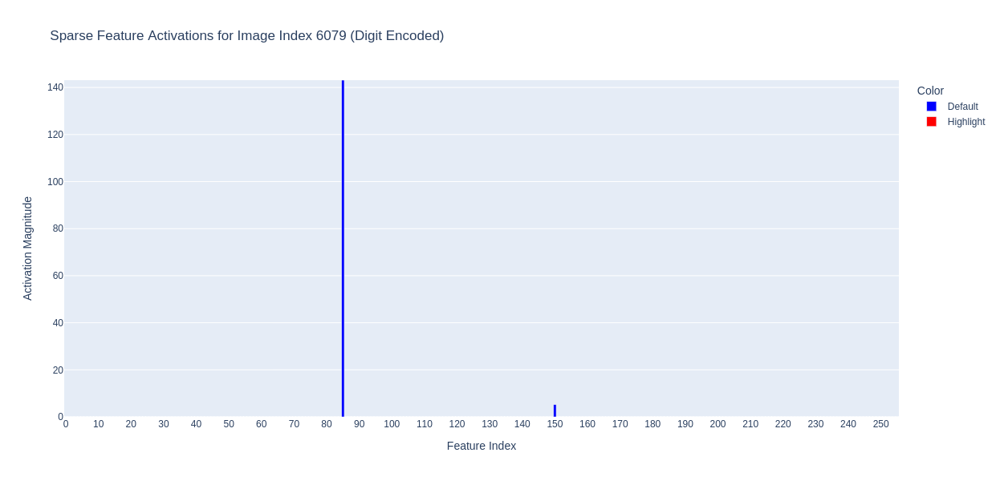

Classification for our encoded vector:
Predicted digit: 7
Probabilities: [4.8236903e-02 4.0393979e-03 2.7761134e-04 2.2391601e-04 5.2124102e-05
 3.6887813e-02 3.1030903e-04 7.7242774e-01 4.7575522e-06 1.3753936e-01]


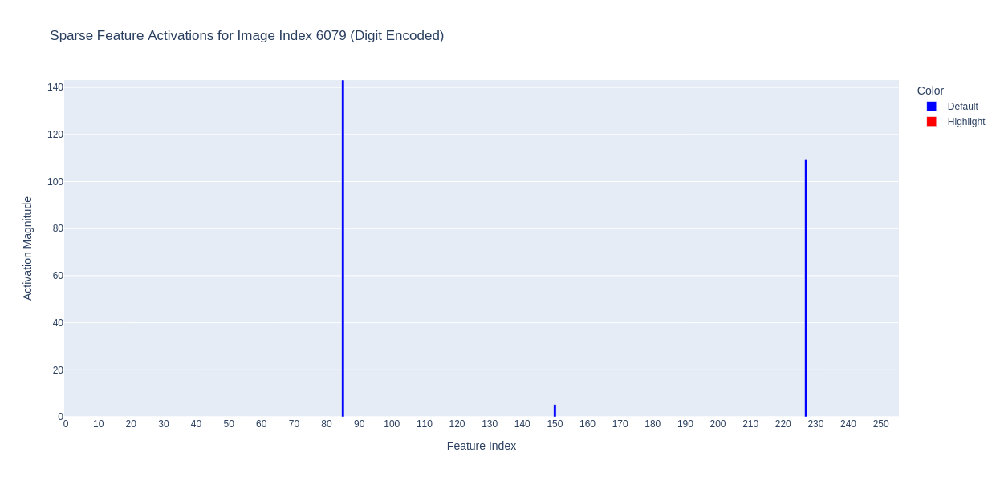

In [57]:
idx = 6079
encoded_digit_6079 = np.zeros(sae_hidden_dim)

encoded_digit_6079[85] = sparse_act_one[idx, 85]
pass_sparse_vector(encoded_digit_6079, idx, device, HIDDEN_SIZE, best_model, best_sae_one)

encoded_digit_6079[150] = sparse_act_one[idx, 150]
pass_sparse_vector(encoded_digit_6079, idx, device, HIDDEN_SIZE, best_model, best_sae_one)

encoded_digit_6079[227] = sparse_act_one[idx, 227]
pass_sparse_vector(encoded_digit_6079, idx, device, HIDDEN_SIZE, best_model, best_sae_one)

Classification for our encoded vector:
Predicted digit: 0
Probabilities: [8.4126651e-01 2.4319820e-03 4.7890254e-04 1.4147742e-03 8.1861450e-05
 4.0817089e-02 1.5075490e-04 7.8569368e-02 3.8360227e-05 3.4750305e-02]


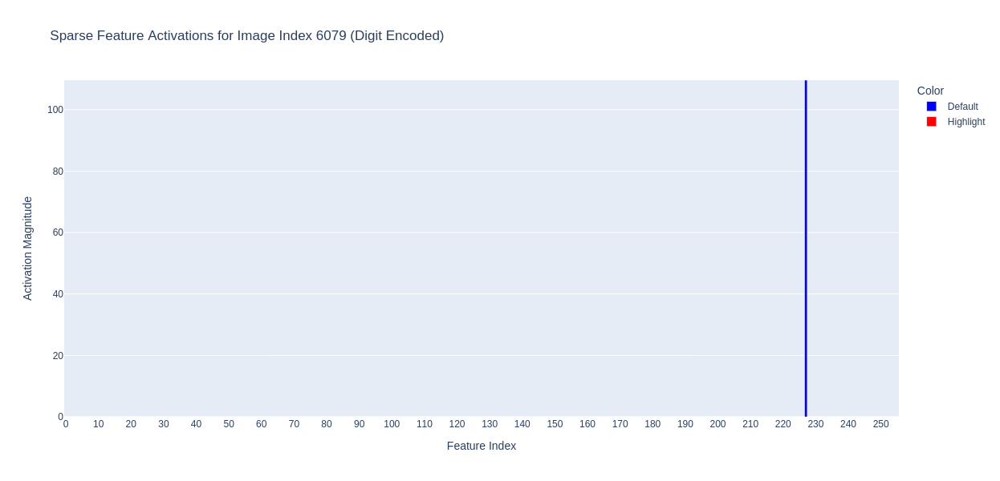

Classification for our encoded vector:
Predicted digit: 7
Probabilities: [6.0522858e-02 4.0488187e-03 2.9889512e-04 2.4621660e-04 6.2068648e-05
 4.2417541e-02 3.8066611e-04 7.5198328e-01 5.3280410e-06 1.4003433e-01]


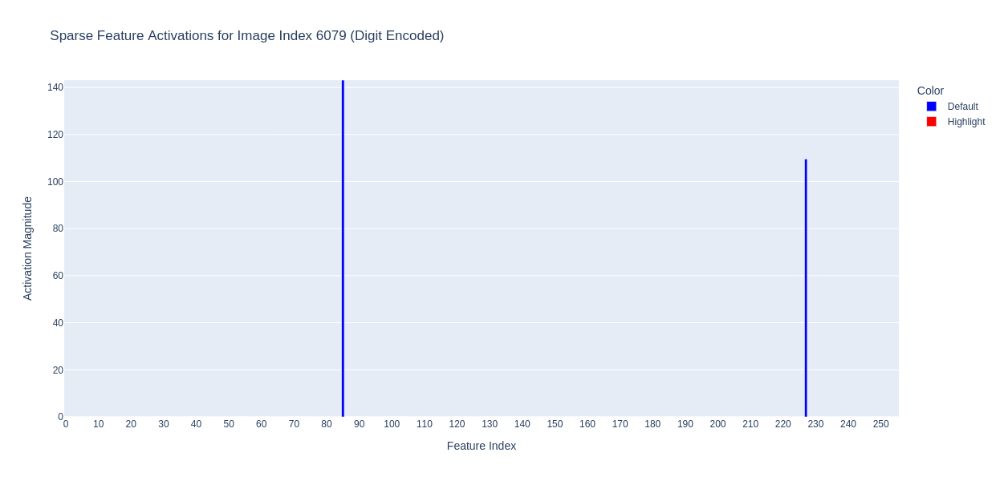

Classification for our encoded vector:
Predicted digit: 7
Probabilities: [4.8236903e-02 4.0393979e-03 2.7761134e-04 2.2391601e-04 5.2124102e-05
 3.6887813e-02 3.1030903e-04 7.7242774e-01 4.7575522e-06 1.3753936e-01]


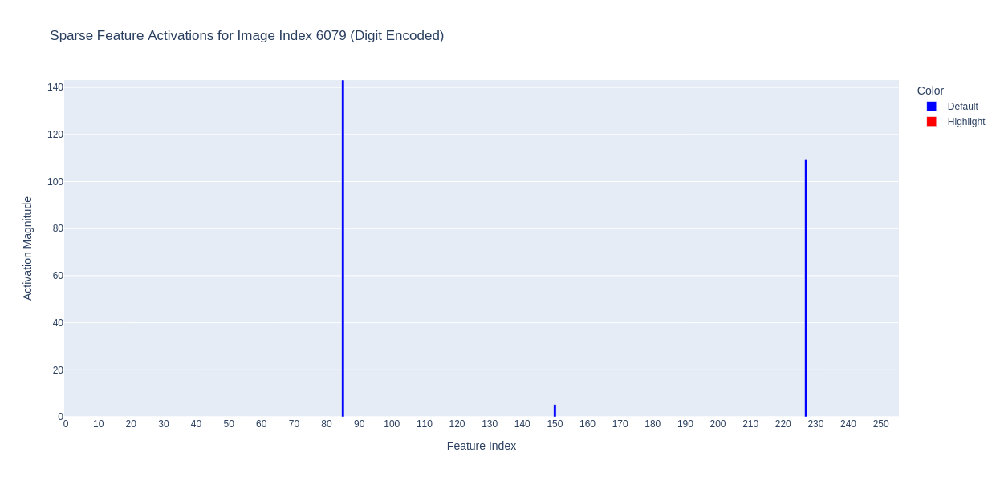

In [58]:
idx = 6079
encoded_digit_6079 = np.zeros(sae_hidden_dim)

encoded_digit_6079[227] = sparse_act_one[idx, 227]
pass_sparse_vector(encoded_digit_6079, idx, device, HIDDEN_SIZE, best_model, best_sae_one)

encoded_digit_6079[85] = sparse_act_one[idx, 85]
pass_sparse_vector(encoded_digit_6079, idx, device, HIDDEN_SIZE, best_model, best_sae_one)

encoded_digit_6079[150] = sparse_act_one[idx, 150]
pass_sparse_vector(encoded_digit_6079, idx, device, HIDDEN_SIZE, best_model, best_sae_one)

So it does seem that with our existing 7, these features serve to distinguish that it is indeed a 7.

How often is that the case?

In [81]:
num_7s = 0
correctly_identified = 0
falsely_identified = {}

for i, label in enumerate(test_labels):
    if label == 7:
        num_7s += 1
        
        encoded = np.zeros(sae_hidden_dim)
        sparse_vector_digit = sparse_act_one[i]
    
        encoded[85] = sparse_vector_digit[85]
        encoded[150] = sparse_vector_digit[150]
        encoded[227] = sparse_vector_digit[227]

        encoded_digit_torch = torch.from_numpy(encoded).float().to(device).unsqueeze(0)

        with torch.no_grad():
            recon_hidden_6079 = best_sae_one.decoder(encoded_digit_torch)
            recon_hidden_6079 = recon_hidden_6079.view(1, -1)
        
            hidden_two = best_model.hidden_two(recon_hidden_6079)
            classification_out = best_model.classification_layer(hidden_two)
        
            probs = torch.softmax(classification_out, dim=1)
            _, pred = torch.max(classification_out, 1)

            if label == pred.item():
                correctly_identified += 1
            else:
                falsely_identified[i] = pred.item()

print(f"The number of correctly identified 7s: {correctly_identified}")
print(f"The number of incorrectly identified 7s: {len(falsely_identified)}")
print(f"Percentage correct: {round(correctly_identified / num_7s * 100, 3)}%")

The number of correctly identified 7s: 595
The number of incorrectly identified 7s: 433
Percentage correct: 57.879%



The digit at idx 26 was classified as 0


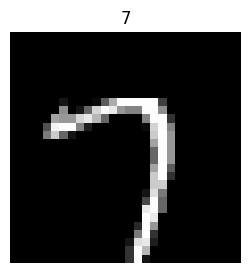

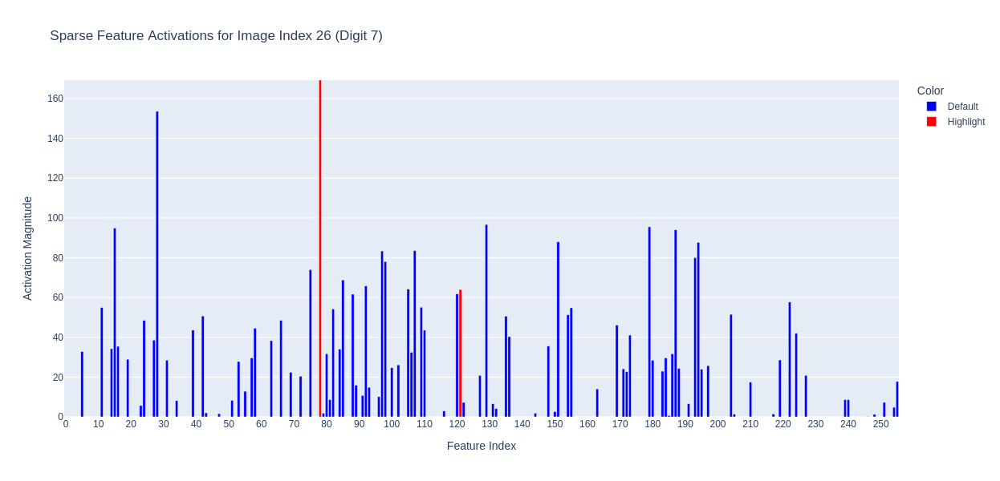


The digit at idx 36 was classified as 0


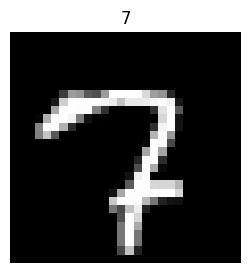

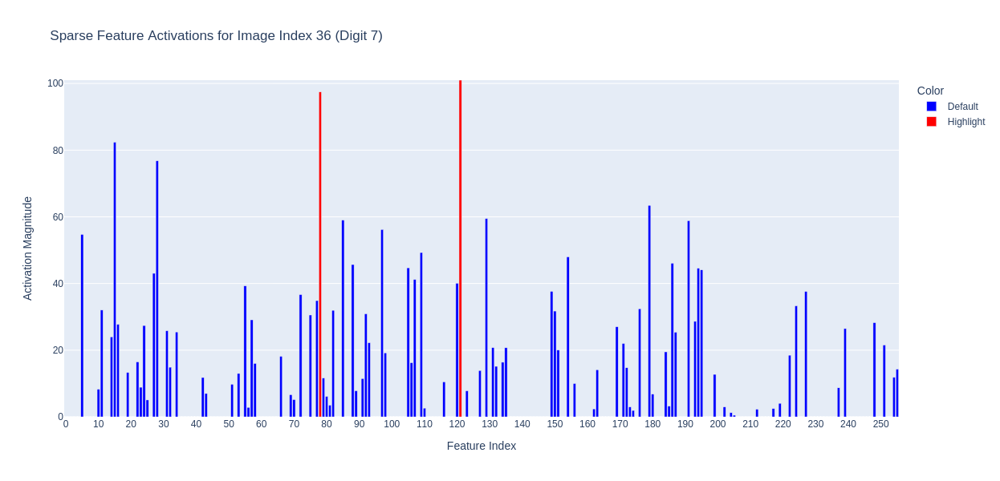


The digit at idx 80 was classified as 0


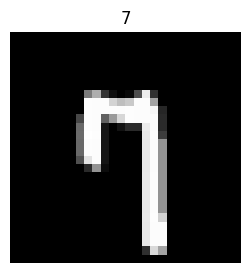

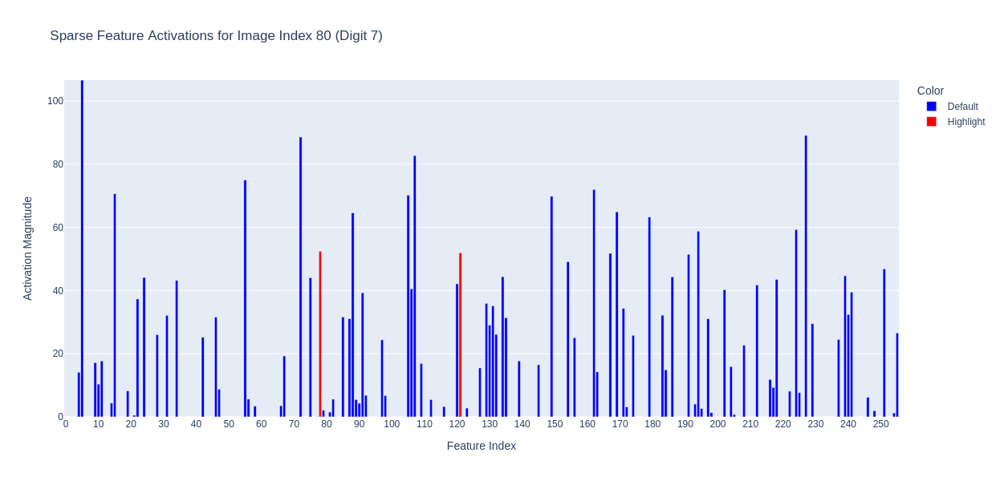


The digit at idx 83 was classified as 0


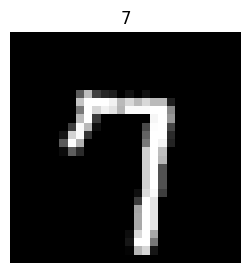

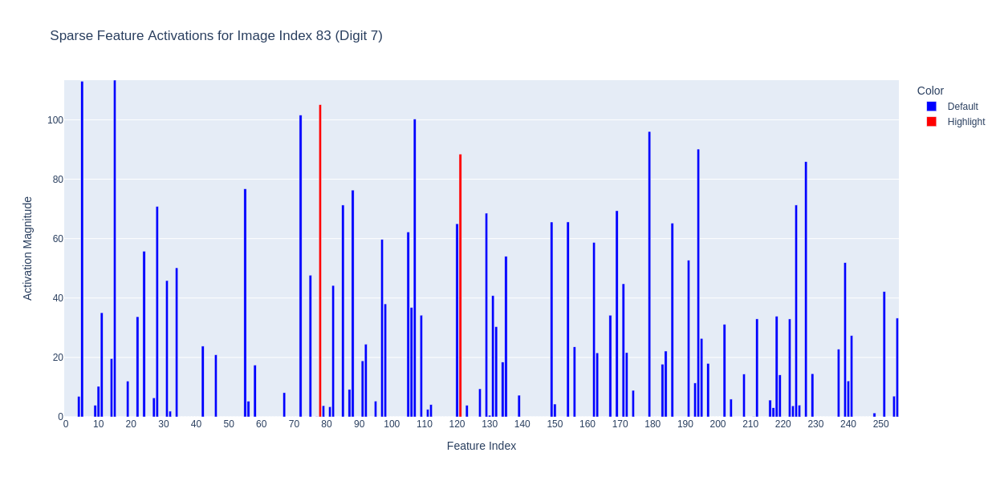


The digit at idx 97 was classified as 0


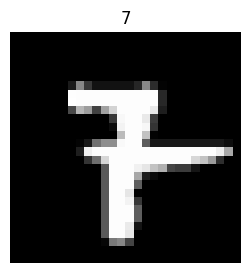

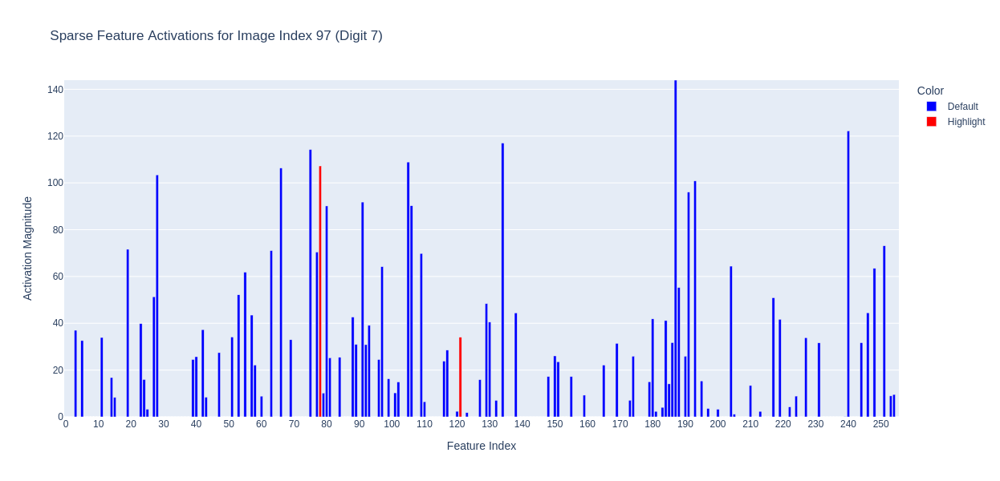

In [91]:
for idx in list(falsely_identified.keys())[:5]:
    print(f"\nThe digit at idx {idx} was classified as {falsely_identified[idx]}")
    visualize_image(test_images[idx], test_labels[idx])
    plot_sparse_features(sparse_act_one[idx], idx, 7, HIDDEN_SIZE)

I won't let it run on all of the above for the sake of the notebook size on save, but when I did, all the 7s were classified as 0s.

So... we need some more information to reliably distinguish 7s from 0s. The good news is that we've appeared to clarify all 7s from 1s and 9s with these 3 subfeatures.

Exploring what the average sparse vector looks like per digit:

Expected digit: 0
Classification for our encoded vector:
Predicted digit: 0
Probabilities: [9.98786986e-01 2.02673666e-13 6.57543947e-04 1.06138605e-05
 2.61031214e-08 1.19730474e-04 1.12194230e-05 5.69303993e-10
 4.13190864e-04 7.31633861e-07]


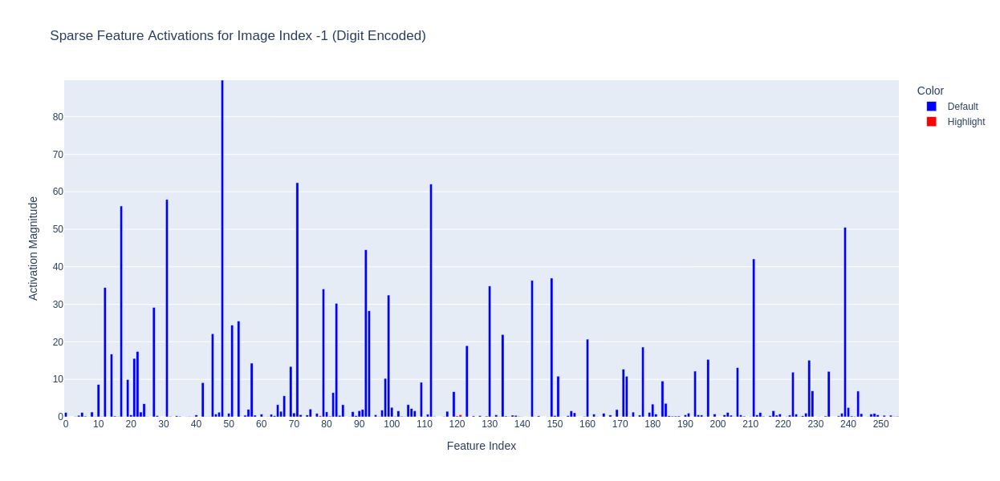

----------------------------------------------------------------------------------------------------
Expected digit: 1
Classification for our encoded vector:
Predicted digit: 8
Probabilities: [0.0000000e+00 6.4019005e-36 5.6778538e-28 1.4406006e-35 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 1.0000000e+00 1.3976999e-29]


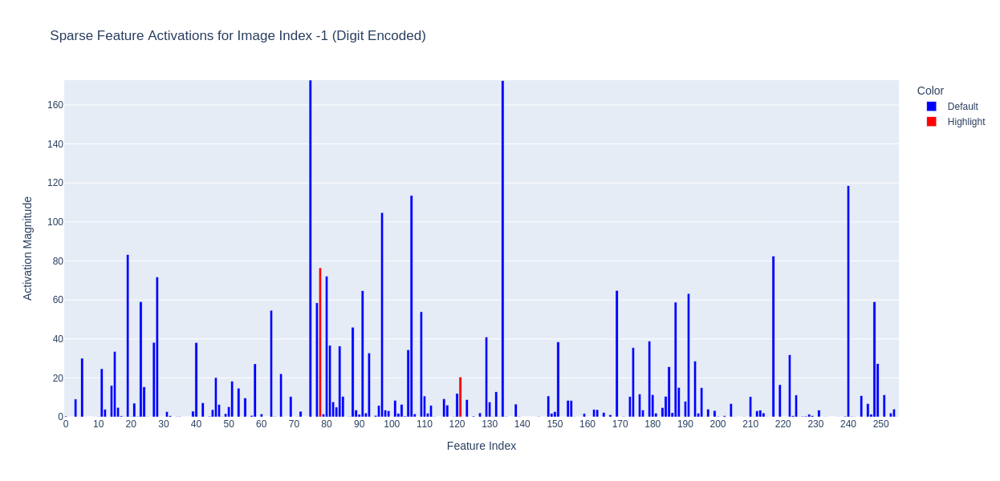

----------------------------------------------------------------------------------------------------
Expected digit: 2
Classification for our encoded vector:
Predicted digit: 8
Probabilities: [0.0000000e+00 2.6867656e-40 4.1825319e-28 2.2287598e-37 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 1.0000000e+00 1.4012985e-45]


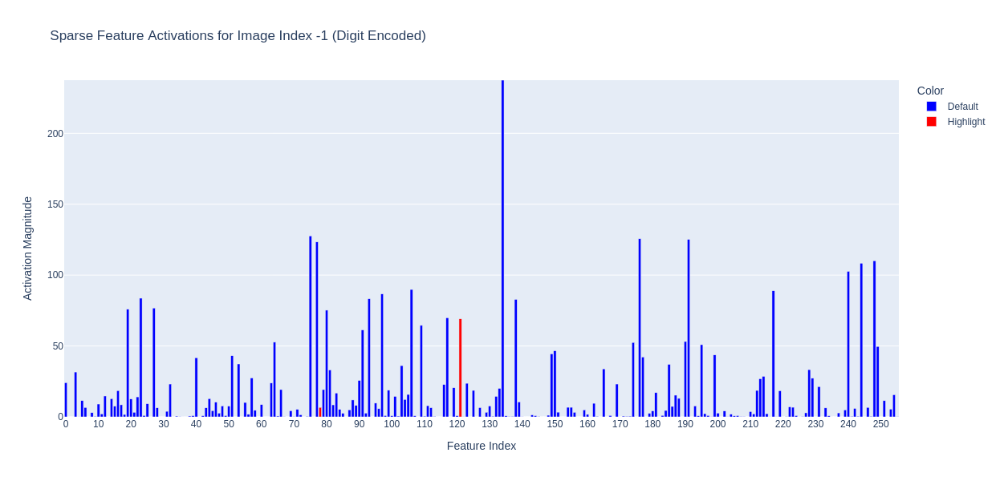

----------------------------------------------------------------------------------------------------
Expected digit: 3
Classification for our encoded vector:
Predicted digit: 8
Probabilities: [0.0000000e+00 8.6260547e-11 6.4554541e-15 7.0505024e-14 0.0000000e+00
 0.0000000e+00 0.0000000e+00 2.7948868e-27 1.0000000e+00 3.1114071e-14]


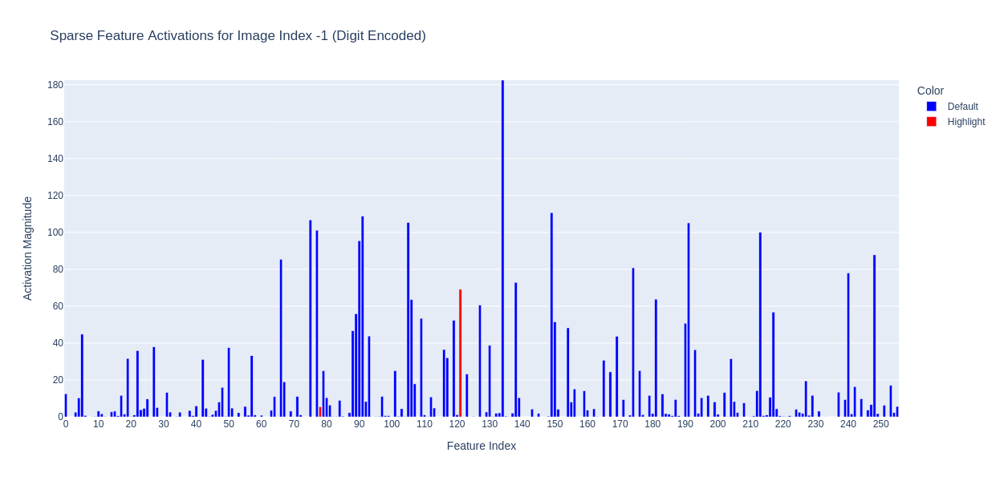

----------------------------------------------------------------------------------------------------
Expected digit: 4
Classification for our encoded vector:
Predicted digit: 8
Probabilities: [1.3906346e-40 3.1360017e-29 1.8102421e-14 1.8600359e-19 5.6051939e-45
 0.0000000e+00 0.0000000e+00 1.1600442e-27 1.0000000e+00 4.3338051e-15]


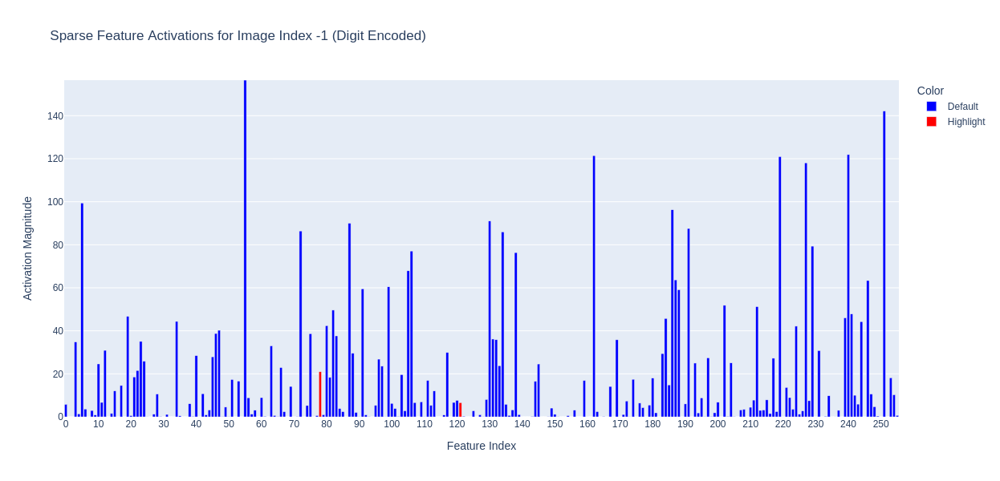

----------------------------------------------------------------------------------------------------
Expected digit: 5
Classification for our encoded vector:
Predicted digit: 8
Probabilities: [1.81422172e-24 1.09319595e-19 1.56634872e-12 2.69707839e-10
 3.60637500e-38 5.54314800e-30 2.80259693e-45 1.11953855e-27
 1.00000000e+00 2.31293934e-13]


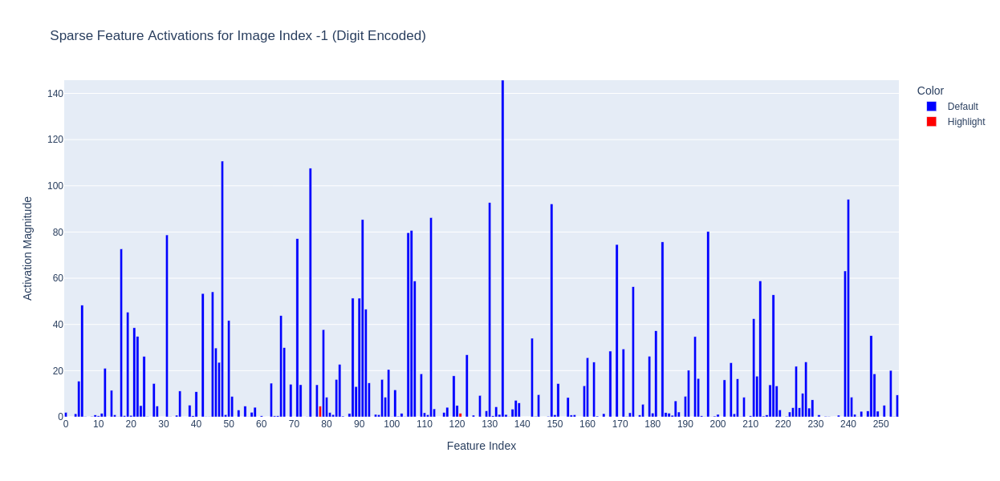

----------------------------------------------------------------------------------------------------
Expected digit: 6
Classification for our encoded vector:
Predicted digit: 8
Probabilities: [0.0000000e+00 0.0000000e+00 5.4623929e-31 1.0717183e-38 2.8025969e-45
 0.0000000e+00 0.0000000e+00 0.0000000e+00 1.0000000e+00 0.0000000e+00]


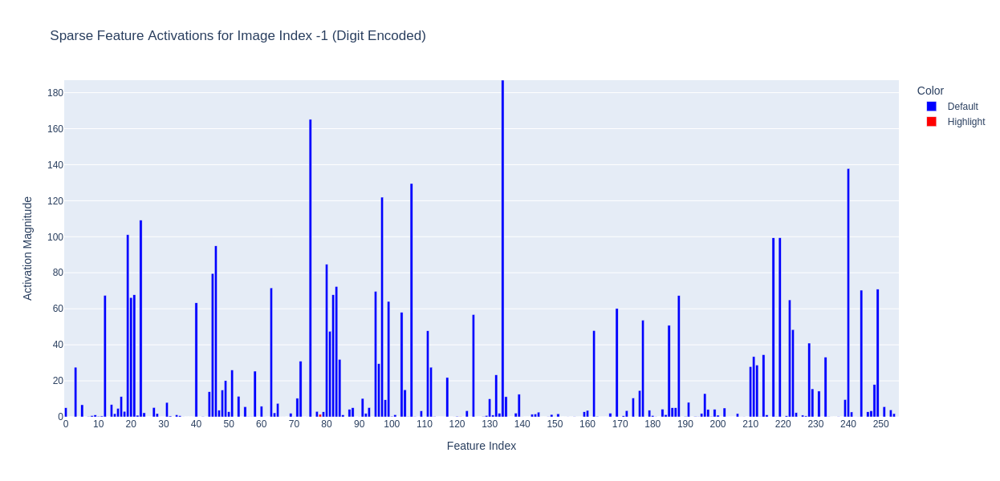

----------------------------------------------------------------------------------------------------
Expected digit: 7
Classification for our encoded vector:
Predicted digit: 9
Probabilities: [0.0000000e+00 1.8662302e-15 2.5406516e-19 1.7514927e-27 0.0000000e+00
 0.0000000e+00 0.0000000e+00 6.4830441e-15 1.2290245e-11 1.0000000e+00]


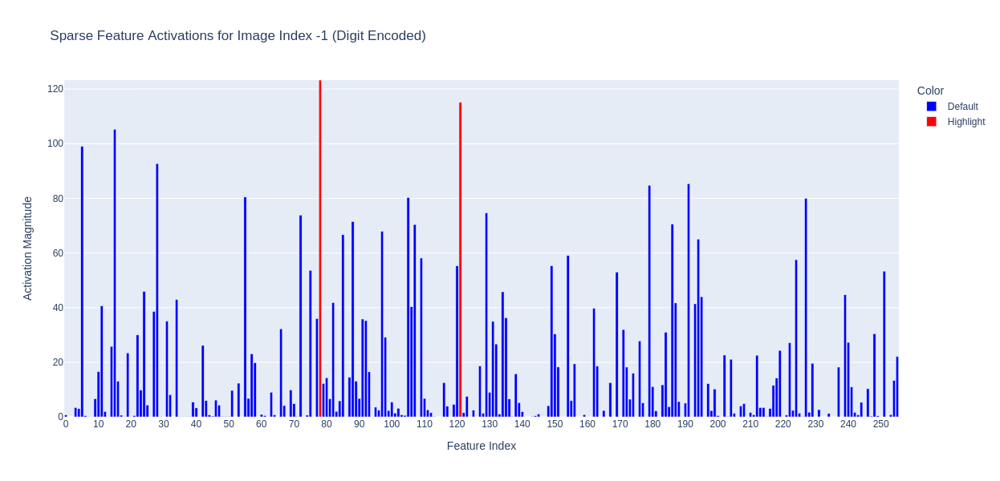

----------------------------------------------------------------------------------------------------
Expected digit: 8
Classification for our encoded vector:
Predicted digit: 8
Probabilities: [0.0000000e+00 1.6122146e-28 1.0825193e-25 2.1221893e-24 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 1.0000000e+00 9.8096499e-31]


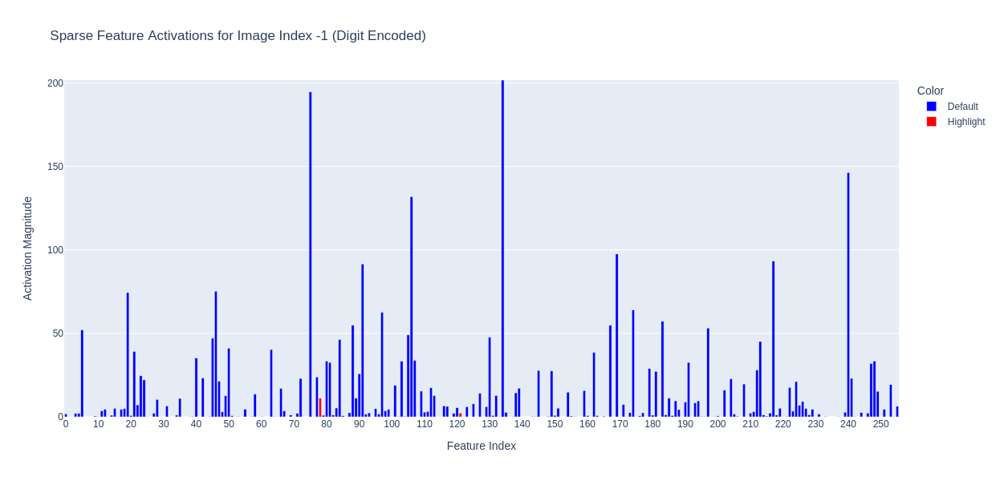

----------------------------------------------------------------------------------------------------
Expected digit: 9
Classification for our encoded vector:
Predicted digit: 9
Probabilities: [0.0000000e+00 3.1711478e-20 5.3906383e-14 6.6756911e-16 0.0000000e+00
 0.0000000e+00 0.0000000e+00 2.2410430e-19 3.8129339e-01 6.1870664e-01]


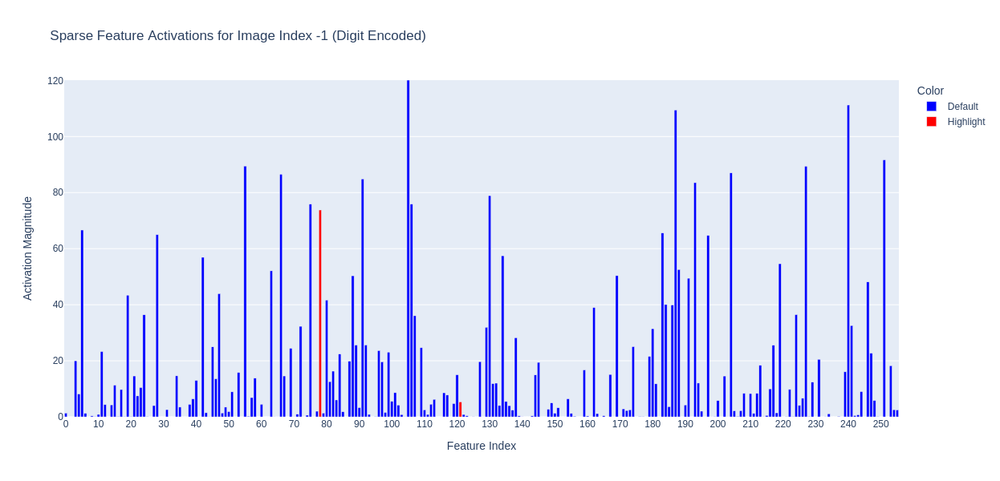

----------------------------------------------------------------------------------------------------


In [97]:
avg_digit_encoding = {}
for digit in range(10):
    mask = labels == digit
    mean_digit_encoding = np.mean(sparse_act_one[mask], axis=0)
    avg_digit_encoding[digit] = mean_digit_encoding

    print(f"Expected digit: {digit}")
    pass_sparse_vector(mean_digit_encoding, -1, device, HIDDEN_SIZE, best_model, best_sae_one)
    print("-" * 100)

Classification for our encoded vector:
Predicted digit: 9
Probabilities: [0.0000000e+00 5.2781571e-17 3.7084717e-29 5.7850278e-35 0.0000000e+00
 0.0000000e+00 0.0000000e+00 1.2361960e-17 1.0462103e-21 1.0000000e+00]


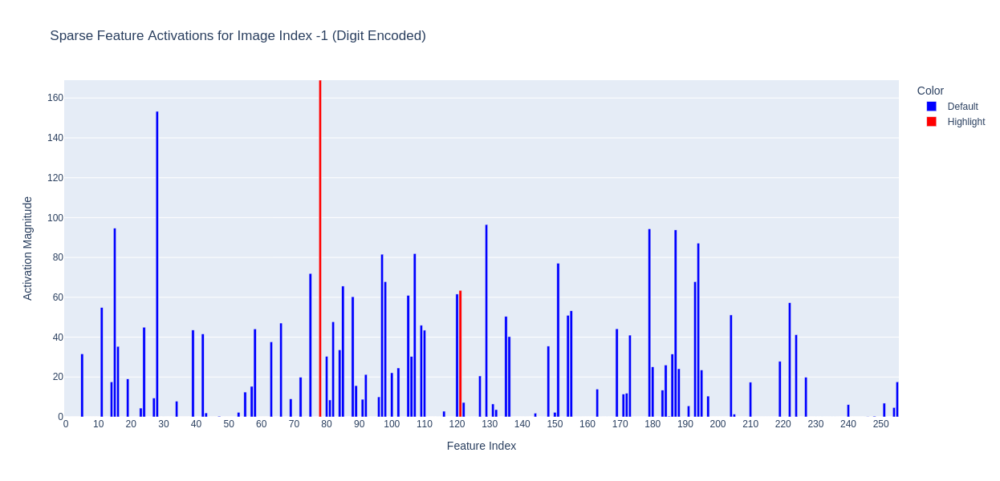

In [101]:
diff_two = sparse_act_one[26] - avg_digit_encoding[0]
pass_sparse_vector(diff_two, -1, device, HIDDEN_SIZE, best_model, best_sae_one)

It looks like feature 28 would make a good distinguishing feature b/w 7s and 0s. Let's test:

Classification for our encoded vector:
Predicted digit: 7
Probabilities: [1.2579592e-15 2.8314039e-06 1.6238874e-09 5.4856394e-11 5.2417714e-17
 7.0706722e-12 8.3558937e-19 6.7243862e-01 1.0921646e-12 3.2755858e-01]


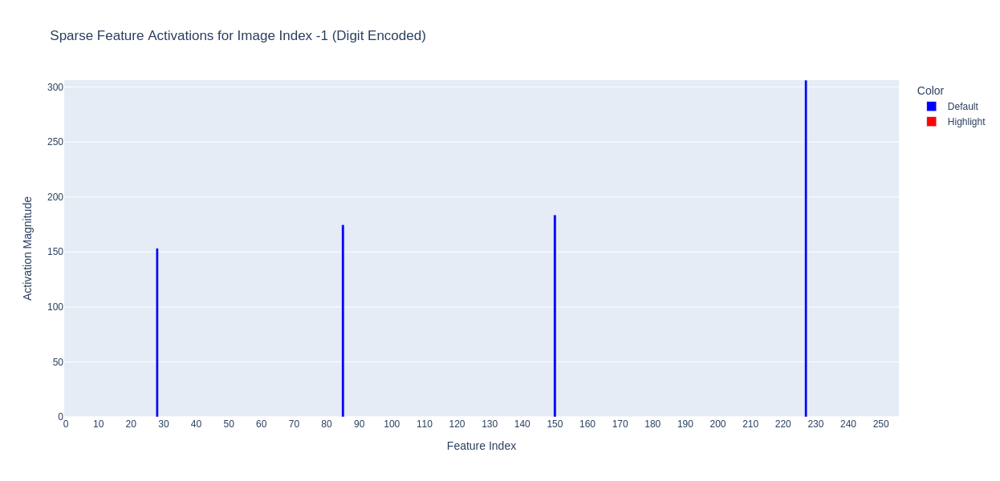

In [102]:
encoded = np.zeros(sae_hidden_dim)
encoded[85] = 174.78
encoded[150] = 183.66
encoded[227] = 306.21

encoded[28] = 153.27  # based on the diff value from above

pass_sparse_vector(encoded, -1, device, HIDDEN_SIZE, best_model, best_sae_one)

Still a 7 when adding 28 to our power 7 feature trio. Does this help when looping through all 7s?

In [104]:
num_7s = 0
correctly_identified = 0
falsely_identified = {}

for i, label in enumerate(test_labels):
    if label == 7:
        num_7s += 1
        
        encoded = np.zeros(sae_hidden_dim)
        sparse_vector_digit = sparse_act_one[i]
    
        encoded[85] = sparse_vector_digit[85]
        encoded[150] = sparse_vector_digit[150]
        encoded[227] = sparse_vector_digit[227]

        encoded[28] = sparse_vector_digit[28]  # hopefully this means we classify less 7s as 0s

        encoded_digit_torch = torch.from_numpy(encoded).float().to(device).unsqueeze(0)

        with torch.no_grad():
            recon_hidden_6079 = best_sae_one.decoder(encoded_digit_torch)
            recon_hidden_6079 = recon_hidden_6079.view(1, -1)
        
            hidden_two = best_model.hidden_two(recon_hidden_6079)
            classification_out = best_model.classification_layer(hidden_two)
        
            probs = torch.softmax(classification_out, dim=1)
            _, pred = torch.max(classification_out, 1)

            if label == pred.item():
                correctly_identified += 1
            else:
                falsely_identified[i] = pred.item()

print(f"The number of correctly identified 7s: {correctly_identified}")
print(f"The number of incorrectly identified 7s: {len(falsely_identified)}")
print(f"Percentage correct: {round(correctly_identified / num_7s * 100, 3)}%")

The number of correctly identified 7s: 94
The number of incorrectly identified 7s: 934
Percentage correct: 9.144%


In [105]:
falsely_identified.values()

dict_values([9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 0, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 0, 9, 9, 9, 9, 9, 0, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 0, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 0, 9, 9, 9, 9, 9, 9, 9, 0, 9, 9, 9, 0, 9, 0, 0, 9, 9, 0, 9, 9, 9, 9, 9, 9, 0, 9, 9, 9, 0, 9, 9, 9, 0, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 0, 9, 9, 9, 0, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 0, 9, 9, 0, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 0, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 0, 9, 9, 9, 9, 9, 9, 

Classification for our encoded vector:
Predicted digit: 1
Probabilities: [2.7407997e-41 9.4589275e-01 5.8596337e-19 2.0538326e-22 2.1155565e-13
 2.1139410e-15 5.5160659e-10 5.0648123e-02 2.5498394e-24 3.4591083e-03]


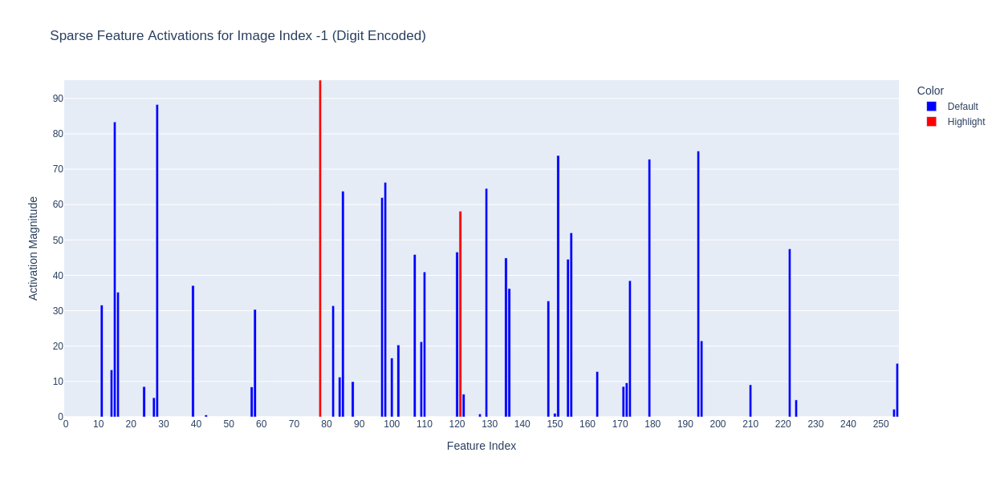

In [107]:
diff_two = sparse_act_one[26] - (avg_digit_encoding[0] + avg_digit_encoding[9])
pass_sparse_vector(diff_two, -1, device, HIDDEN_SIZE, best_model, best_sae_one)

In [108]:
num_7s = 0
correctly_identified = 0
falsely_identified = {}

for i, label in enumerate(test_labels):
    if label == 7:
        num_7s += 1
        
        encoded = np.zeros(sae_hidden_dim)
        sparse_vector_digit = sparse_act_one[i]
    
        encoded[85] = sparse_vector_digit[85]
        encoded[150] = sparse_vector_digit[150]
        encoded[227] = sparse_vector_digit[227]

        encoded[15] = sparse_vector_digit[15]  # hopefully this means we classify less 7s as 0s

        encoded_digit_torch = torch.from_numpy(encoded).float().to(device).unsqueeze(0)

        with torch.no_grad():
            recon_hidden_6079 = best_sae_one.decoder(encoded_digit_torch)
            recon_hidden_6079 = recon_hidden_6079.view(1, -1)
        
            hidden_two = best_model.hidden_two(recon_hidden_6079)
            classification_out = best_model.classification_layer(hidden_two)
        
            probs = torch.softmax(classification_out, dim=1)
            _, pred = torch.max(classification_out, 1)

            if label == pred.item():
                correctly_identified += 1
            else:
                falsely_identified[i] = pred.item()

print(f"The number of correctly identified 7s: {correctly_identified}")
print(f"The number of incorrectly identified 7s: {len(falsely_identified)}")
print(f"Percentage correct: {round(correctly_identified / num_7s * 100, 3)}%")

The number of correctly identified 7s: 859
The number of incorrectly identified 7s: 169
Percentage correct: 83.56%


In [109]:
falsely_identified.values()

dict_values([9, 0, 9, 0, 9, 9, 0, 0, 0, 9, 9, 9, 0, 0, 0, 0, 9, 0, 0, 9, 0, 9, 9, 9, 0, 9, 0, 0, 0, 0, 0, 9, 0, 9, 9, 0, 9, 0, 0, 0, 0, 0, 0, 9, 0, 9, 9, 0, 0, 9, 0, 0, 9, 9, 0, 0, 9, 9, 9, 0, 9, 9, 0, 9, 0, 0, 9, 0, 0, 0, 9, 0, 9, 0, 9, 9, 9, 0, 9, 9, 0, 0, 0, 9, 0, 0, 9, 9, 0, 0, 9, 9, 0, 9, 9, 0, 9, 9, 9, 9, 0, 0, 0, 0, 0, 0, 9, 9, 0, 0, 0, 9, 0, 0, 9, 0, 0, 9, 9, 9, 0, 0, 9, 0, 9, 0, 9, 0, 0, 0, 0, 9, 0, 9, 9, 0, 9, 9, 9, 9, 9, 9, 9, 9, 0, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 0, 0, 0, 0, 0, 0, 0, 0, 9, 9, 9, 9])

Perhaps rather than trying vectors from the diff... we should try to get other mostly maximal features for 7, that don't intertwine w/other closely related digit classes

We also need to see what images produce these sparse features...